<a href="https://colab.research.google.com/github/mjharavind/reddit-sentiment-wellington-housing/blob/main/notebooks/civil788ab_reddit_housing_analysis_may2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **THEMATIC SENTIMENT ANALYSIS OF WELLINGTON HOUSING DISCUSSIONS (Reddit & Cotality)**

This Google Colab notebook contains the complete data processing, analysis, and visualisation pipeline for my research project, "Thematic Sentiment Analysis of Reddit Discussions as an Indicator of Wellington Housing Market Trends."

# [1.] Environment Setup and Dependencies
In this first section, I'll prepare the Google Colab environment.

A critical step I discovered during my research was the need to install very specific versions of the plotly and kaleido libraries. I found that only this particular combination allowed me to reliably export my visualisations as high-quality PDF files, which was essential for my final report. The following cell handles this setup. It should only need to be run once per session. The automatic kernel restart at the end is expected and indicates that the installation was successful.

In [ ]:
# ==============================================================================
# THE DEFINITIVE ONE-CELL SETUP FOR PLOTLY/KALEIDO IN COLAB
#
# Run this cell ONCE after a "Factory reset runtime".
# This will permanently configure your session to save Plotly images.
# ==============================================================================

# 1. Install all required system libraries (for the browser engine)
print("--> Step 1 of 3: Installing system dependencies...")
# The '-qq' flag makes the output silent
!apt-get update -qq
!apt-get install -qq -y libnss3 libatk-bridge2.0-0 libcups2 libxcomposite1 libxdamage1 libxfixes3 libxrandr2 libgbm1 libxkbcommon0 libpango-1.0-0 libcairo2 libasound2 chromium-chromedriver

# 2. Install SPECIFIC, KNOWN-COMPATIBLE versions of the Python libraries
print("\n--> Step 2 of 3: Installing specific versions of Plotly and Kaleido...")
# We are downgrading Kaleido to the very stable 0.2.1 version and ensuring
# Plotly is a modern, compatible version.
!pip install -q plotly kaleido==0.2.1

# 3. Automatically restart the runtime to apply all changes
import os
print("\n--> Step 3 of 3: All installations complete. Kernel will now restart automatically.")
print("      The 'Session crashed' message is NORMAL and means it worked.")
os._exit(0)

--> Step 1 of 3: Installing system dependencies...
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Preconfiguring packages ...
Selecting previously unselected package apparmor.
(Reading database ... 125082 files and directories currently installed.)
Preparing to unpack .../apparmor_3.0.4-2ubuntu2.4_amd64.deb ...
Unpacking apparmor (3.0.4-2ubuntu2.4) ...
Selecting previously unselected package squashfs-tools.
Preparing to unpack .../squashfs-tools_1%3a4.5-3build1_amd64.deb ...
Unpacking squashfs-tools (1:4.5-3build1) ...
Preparing to unpack .../libudev1_249.11-0ubuntu3.17_amd64.deb ...
Unpacking libudev1:amd64 (249.11-0ubuntu3.17) over (249.11-0ubuntu3.12) ...
Setting up libudev1:amd64 (249.11-0ubuntu3.17) ...
Selecting previously unselected package udev.
(Reading database ... 125282 files and directories currently installed.)
Preparing to unpack .

# [2.] Library Imports and Google Drive Connection

Now that the environment is configured, I'll import the Google Drive library and warnings to hide persistent python library warnings.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### A Note on Library Warnings

Python libraries are constantly evolving. Occasionally, updates can cause "Deprecation Warnings" to appear in the output. These warnings are not errors; they are simply notifications from library developers that a certain function may be phased out in a future version.

To maintain a clean and readable output for this analysis, the following code cell is configured to suppress these specific, non-critical warnings. If you happen to see new warnings appear during your session, simply re-running the cell below will often resolve the issue.

In [ ]:
import os
import warnings

# Set the environment variable to ignore deprecation warnings globally
# This is the most effective method for suppressing early startup warnings
os.environ['PYTHONWARNINGS'] = 'ignore::DeprecationWarning'

# You can also keep the original filter for good measure, though the one above should handle it
warnings.filterwarnings('ignore', category=DeprecationWarning)

# Now continue with your other imports like pandas, etc.
# import pandas as pd
# ...

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning:

datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning:

datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning:

datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning:

datetime.datetime.utcnow() is deprecated and scheduled for removal in a future v

In [ ]:
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

In [ ]:
import warnings

# Add this to the top of your notebook to ignore deprecation warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)


### A Note on Runtimes

I developed this notebook using a Google Colab Pro subscription with a GPU runtime (specifically, the L4 GPU). This significantly speeds up the computationally intensive parts of the analysis.

If you are running this on a standard, CPU-only runtime, please be aware that the following cells will take much longer to execute:
*   **RoBERTa Sentiment Analysis (Section 8):** May take 15-20 minutes or more on a CPU vs. ~1 minute on a GPU.
*   **LDA Topic Modelling (Section 7):** May take 15-20 minutes or more on a CPU vs. ~1 minute on a GPU.

# [3.] Data Loading and Initial Preprocessing
My research uses three primary datasets: Reddit submission data, Reddit comment data (both from the r/Wellington subreddit), and housing market data from Cotality. In this section, I will prepare the environment and download all necessary data.

## Data Acquisition

**1. Reddit Data (Publicly Available):**

The raw Reddit submissions (`Wellington_submissions.zst`) and comments (`Wellington_comments.zst`) are large files. To make this notebook reproducible, I have hosted them on Google Drive. The code cell below will create a `data` directory in this Colab environment and download both files directly into it using the `gdown` utility.

**2. Cotality Housing Data (Restricted Access):**

The housing market data used in this study was accessed under a license agreement from Cotality via the University of Auckland Library. **Due to these licensing restrictions, the raw Cotality data cannot be shared publicly.**

To reproduce the final part of this analysis (Section 11 onwards), you must have your own access to the Cotality dataset and follow these steps:
1.  Export the relevant Wellington City sales data as a CSV file.
2.  Upload this CSV file to your own Google Drive.
3.  Right-click the file and select **Share** -> **Share**.
4.  Under "General access," change it from "Restricted" to "**Anyone with the link**".
5.  Click "**Copy link**" and extract the **File ID** from the URL.
6.  Paste your File ID into the `housing_data_file_id` variable in the code cell below.

## Loading the Reddit Submission Data
The Reddit data is stored in a large Zstandard compressed NDJSON file (Wellington_submissions.zst). I've written a helper function, zst_ndjson_to_df, to handle the decompression and parsing of this file line-by-line into a Pandas DataFrame. This method is memory-efficient for very large files.

For this analysis, I'm only focusing on the submissions (the original posts), so I will only process the submissions file.

The submissions part is called Wellington_submission.zst which contains the title and the body of that post.

The discussion part is stored in the Wellington_comments.zst which is not within the scope of this research

The comments could be removed to load the comments file if required. But this is out of scope for this project. Loading the Wellington_submissions.zst will output 72148 rows and 135 columns.The idea is that first this is stored in the dataframe **df_submissions**.

In [ ]:
# Create a directory to store our data
!mkdir -p data

# Install the gdown library to download files from Google Drive
!pip install -q gdown

# --- Download the Reddit Data from Google Drive ---

# 1. Download the Submissions Data
submissions_file_id = '1A_sxrYEMmEQmtj59RCTOA-OtnS1gWDcV'
submissions_output_path = 'data/Wellington_submissions.zst'
print("Downloading submissions data from Google Drive...")
!gdown --id {submissions_file_id} -O {submissions_output_path}
print(f"Submissions data downloaded to {submissions_output_path}")

# 2. Download the Comments Data
comments_file_id = '1y4PNzVJW5X1Ac5mqVPwyxGh3O8qqzCDe'
comments_output_path = 'data/Wellington_comments.zst'
print("\nDownloading comments data from Google Drive...")
!gdown --id {comments_file_id} -O {comments_output_path}
print(f"Comments data downloaded to {comments_output_path}")

# --- Download the Cotality Housing Data (if available) ---
# NOTE: This file is under a restrictive license and is not publicly shared.
# A user must have their own access and upload it to Google Drive to use this link.
housing_data_file_id = '1sHhr-lwqQAbTLI1NibxlSD93Ud5-HRiZ'
housing_data_output_path = 'data/wellington_housing_data.csv' # Using a generic name
print("\nDownloading Cotality housing data from Google Drive...")
!gdown --id {housing_data_file_id} -O {housing_data_output_path}
print(f"Housing data downloaded to {housing_data_output_path}")


# --- Define file paths for the rest of the notebook ---
DATA_PATH = "data/"
submissions_file_path = f"{DATA_PATH}Wellington_submissions.zst"
comments_file_path = f"{DATA_PATH}Wellington_comments.zst"
housing_data_file_path = f"{DATA_PATH}wellington_housing_data.csv" # Path to the new local file

print(f"\nSubmissions file path set to: {submissions_file_path}")
print(f"Comments file path set to: {comments_file_path}")
print(f"Housing data file path set to: {housing_data_file_path}")

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1A_sxrYEMmEQmtj59RCTOA-OtnS1gWDcV
To: /content/data/Wellington_submissions.zst
100% 23.6M/23.6M [00:00<00:00, 27.4MB/s]
Submissions data downloaded to data/Wellington_submissions.zst

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1y4PNzVJW5X1Ac5mqVPwyxGh3O8qqzCDe
From (redirected): https://drive.google.com/uc?id=1y4PNzVJW5X1Ac5mqVPwyxGh3O8qqzCDe&confirm=t&uuid=3cec3750-79e7-4493-8189-45896eca1189
To: /content/data/Wellington_comments.zst
100% 166M/166M [00:02<00:00, 65.1MB/s]
Comments

In [ ]:
import zstandard

In [ ]:
import pandas as pd
import json
import io

In [ ]:
# --- Function to read a ZST/NDJSON file into a Pandas DataFrame ---
def zst_ndjson_to_df(file_path):
    """
    Reads a Zstandard compressed NDJSON file and returns a Pandas DataFrame.
    """
    data_list = []
    print(f"Processing file: {file_path}")
    try:
        with open(file_path, 'rb') as fh:
            dctx = zstandard.ZstdDecompressor()
            # Use stream_reader to decompress and read in chunks
            with dctx.stream_reader(fh) as reader:
                # Wrap the byte stream in a TextIOWrapper to handle decoding and line-by-line iteration
                text_stream = io.TextIOWrapper(reader, encoding='utf-8')
                count = 0
                for line in text_stream:
                    try:
                        # Each line is a JSON object
                        data_list.append(json.loads(line))
                        count += 1
                        if count % 100000 == 0: # Print progress every 100,000 lines
                            print(f"  Read {count} lines...")
                    except json.JSONDecodeError as e:
                        print(f"Skipping malformed JSON line: {line.strip()} - Error: {e}")
                    except Exception as e:
                        print(f"An unexpected error occurred processing line: {line.strip()} - Error: {e}")

        print(f"Finished processing. Total lines read: {count}")
        if not data_list:
            print("No data was loaded. The list is empty.")
            return pd.DataFrame() # Return an empty DataFrame if no data
        return pd.DataFrame(data_list)

    except FileNotFoundError:
        print(f"ERROR: File not found at {file_path}")
        return pd.DataFrame() # Return an empty DataFrame if file not found
    except Exception as e:
        print(f"An unexpected error occurred opening or decompressing the file: {e}")
        return pd.DataFrame() # Return an empty DataFrame on other errors


In [ ]:
# --- Process the Comments File ---
# print("--- Reading Comments ---")
# df_comments = zst_ndjson_to_df(comments_file_path)

# if not df_comments.empty:
#     print("\nFirst 5 rows of comments DataFrame:")
#     print(df_comments.head())
#     print(f"\nShape of comments DataFrame: {df_comments.shape}")
#     print("\nInfo for comments DataFrame:")
#     df_comments.info(verbose=True, show_counts=True) # verbose=True and show_counts=True give more detail for large DFs
# else:
#     print("Comments DataFrame is empty.")

# --- Process the Submissions File ---
print("\n--- Reading Submissions ---")
df_submissions = zst_ndjson_to_df(submissions_file_path)

if not df_submissions.empty:
    print("\nFirst 5 rows of submissions DataFrame:")
    print(df_submissions.head())
    print(f"\nShape of submissions DataFrame: {df_submissions.shape}")
    print("\nInfo for submissions DataFrame:")
    df_submissions.info(verbose=True, show_counts=True)
else:
    print("Submissions DataFrame is empty.")

# --- Now you can work with df_comments and df_submissions ---
# For example, to see columns:
# if not df_comments.empty:
#     print("\nComment columns:", df_comments.columns.tolist())
# if not df_submissions.empty:
#     print("\nSubmission columns:", df_submissions.columns.tolist())


--- Reading Submissions ---
Processing file: data/Wellington_submissions.zst
Finished processing. Total lines read: 72148

First 5 rows of submissions DataFrame:
  archived     author author_flair_background_color author_flair_css_class  \
0     True  [deleted]                                                 None   
1     True  [deleted]                                                 None   
2     True  [deleted]                                                 None   
3     True      jevon                          None                          
4      NaN      jevon                           NaN                          

  author_flair_text author_flair_text_color brand_safe can_gild contest_mode  \
0              None                    dark       True    False        False   
1              None                    dark       True    False        False   
2              None                    dark       True    False        False   
3               ^_^                    None     

## Selecting Relevant Columns and Basic Cleaning

The raw dataset contains many columns (135) that aren't relevant to my analysis. To make the DataFrame more manageable, I'll select a specific subset of columns.

I'll also perform some essential cleaning and feature engineering:

1.   Convert the created_utc timestamp into a proper datetime object, which I'll name timestamp. This is crucial for all time-series analysis.
2.   Clean the selftext column by filling any missing values and removing standard Reddit placeholders like [removed] or [deleted].

So bascially after running this step, I'll have 15 relevant columns with the same 72148 rows of data. I called this datafrmae as **df_submissions_selected**.



In [ ]:
import pandas as pd

# Assume df_submissions is already loaded from your .zst file
# For example:
# print("--- Reading Submissions ---")
# df_submissions = zst_ndjson_to_df(submissions_file_path) # From previous step

if 'df_submissions' not in locals() or df_submissions.empty:
    print("Error: df_submissions is not loaded or is empty.")
    print("Please ensure you have run the code to load 'Wellington_submissions.zst' first.")
else:
    print(f"Original df_submissions shape: {df_submissions.shape}")
    print(f"Original df_submissions columns: {df_submissions.columns.tolist()}")

    # Define the list of columns we are interested in
    selected_columns = [
        'id',              # Unique ID of the submission
        'created_utc',     # Timestamp of creation (Unix epoch)
        'author',          # Author's username
        'title',           # Title of the submission
        'selftext',        # Body of the submission (for text posts)
        'score',           # Score of the submission
        'num_comments',    # Number of comments
        'permalink',       # Relative link to the submission
        'url',             # URL (for link posts, or permalink for self-posts)
        'is_self',         # Boolean: True if self-post (text), False if link post
        'subreddit',       # Subreddit name
        'domain',          # Domain of the linked URL (if a link post)
        'stickied',        # Is the post stickied?
        'over_18',         # Is the post NSFW?
        # Add any other columns you identified as potentially useful, e.g.:
        # 'retrieved_on', 'retrieved_utc', 'updated_utc' (if available and desired)
        # 'full_link',
        # 'author_flair_text',
    ]

    # Filter out columns that don't exist in the DataFrame to avoid KeyErrors
    # Pushshift dumps can sometimes have slight variations in available fields
    existing_selected_columns = [col for col in selected_columns if col in df_submissions.columns]
    missing_columns = [col for col in selected_columns if col not in df_submissions.columns]

    if missing_columns:
        print(f"\nNote: The following desired columns were not found in the DataFrame and will be skipped: {missing_columns}")

    print(f"\nSelected columns to be extracted: {existing_selected_columns}")

    # Create a new DataFrame with only the selected columns
    # Using .copy() is good practice to avoid SettingWithCopyWarning later
    df_submissions_selected = df_submissions[existing_selected_columns].copy()

    # --- Data Type Conversion and Feature Engineering ---

    # 1. Convert 'created_utc' to datetime objects
    if 'created_utc' in df_submissions_selected.columns:
        # Ensure it's numeric first (sometimes it can be loaded as object)
        df_submissions_selected['created_utc'] = pd.to_numeric(df_submissions_selected['created_utc'], errors='coerce')
        df_submissions_selected.dropna(subset=['created_utc'], inplace=True) # Drop rows where conversion failed
        df_submissions_selected['timestamp'] = pd.to_datetime(df_submissions_selected['created_utc'], unit='s', utc=True)
        # You might want to convert to a specific timezone, e.g., New Zealand time
        # df_submissions_selected['timestamp_nz'] = df_submissions_selected['timestamp'].dt.tz_convert('Pacific/Auckland')
    else:
        print("Warning: 'created_utc' column not found for timestamp conversion.")

    # 2. Handle potentially missing 'selftext'
    # If 'selftext' is [removed] or [deleted], or None/NaN, replace with an empty string
    # for consistency in NLP processing.
    if 'selftext' in df_submissions_selected.columns:
        df_submissions_selected['selftext'] = df_submissions_selected['selftext'].fillna('')
        df_submissions_selected['selftext'] = df_submissions_selected['selftext'].replace(['[removed]', '[deleted]'], '', regex=False)
    else:
        print("Warning: 'selftext' column not found.")


    # --- Display information about the new DataFrame ---
    print("\n--- Selected Submissions DataFrame ---")
    print(f"Shape of selected submissions DataFrame: {df_submissions_selected.shape}")

    print("\nFirst 5 rows of selected submissions DataFrame:")
    print(df_submissions_selected.head())

    print("\nInfo for selected submissions DataFrame:")
    df_submissions_selected.info()

    # Example: Check for unique values in 'subreddit' to confirm it's all Wellington
    if 'subreddit' in df_submissions_selected.columns:
        print("\nUnique subreddits found:", df_submissions_selected['subreddit'].unique())

    # Example: Check distribution of 'is_self'
    if 'is_self' in df_submissions_selected.columns:
        print("\nDistribution of post types (is_self):")
        print(df_submissions_selected['is_self'].value_counts(dropna=False))

    # Example: Check for posts marked as 'over_18' (NSFW)
    if 'over_18' in df_submissions_selected.columns:
        print("\nDistribution of 'over_18' (NSFW) posts:")
        print(df_submissions_selected['over_18'].value_counts(dropna=False))
        # You might want to filter these out later:
        # df_submissions_final = df_submissions_selected[df_submissions_selected['over_18'] == False]

    # At this point, df_submissions_selected is your working DataFrame
    # for submissions with a manageable set of columns.

Original df_submissions shape: (72148, 135)
Original df_submissions columns: ['archived', 'author', 'author_flair_background_color', 'author_flair_css_class', 'author_flair_text', 'author_flair_text_color', 'brand_safe', 'can_gild', 'contest_mode', 'created_utc', 'distinguished', 'domain', 'edited', 'gilded', 'hidden', 'hide_score', 'id', 'is_crosspostable', 'is_reddit_media_domain', 'is_self', 'is_video', 'link_flair_css_class', 'link_flair_richtext', 'link_flair_text', 'link_flair_text_color', 'link_flair_type', 'locked', 'media', 'media_embed', 'no_follow', 'num_comments', 'num_crossposts', 'over_18', 'parent_whitelist_status', 'permalink', 'retrieved_on', 'rte_mode', 'score', 'secure_media', 'secure_media_embed', 'selftext', 'send_replies', 'spoiler', 'stickied', 'subreddit', 'subreddit_id', 'subreddit_name_prefixed', 'subreddit_type', 'suggested_sort', 'thumbnail', 'thumbnail_height', 'thumbnail_width', 'title', 'url', 'whitelist_status', 'author_flair_richtext', 'author_flair_typ

In [ ]:
df_submissions_selected.columns

Index(['id', 'created_utc', 'author', 'title', 'selftext', 'score',
       'num_comments', 'permalink', 'url', 'is_self', 'subreddit', 'domain',
       'stickied', 'over_18', 'timestamp'],
      dtype='object')

In [ ]:
df_submissions_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72148 entries, 0 to 72147
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   id            72148 non-null  object             
 1   created_utc   72148 non-null  float64            
 2   author        72148 non-null  object             
 3   title         72148 non-null  object             
 4   selftext      72148 non-null  object             
 5   score         72148 non-null  int64              
 6   num_comments  72148 non-null  int64              
 7   permalink     72148 non-null  object             
 8   url           72024 non-null  object             
 9   is_self       72148 non-null  bool               
 10  subreddit     72148 non-null  object             
 11  domain        72024 non-null  object             
 12  stickied      71584 non-null  object             
 13  over_18       72148 non-null  bool               
 14  timest

In [ ]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
print(df_submissions_selected.iloc[61300])

id                                                                                                                                                197v5ui
created_utc                                                                                                                                  1705383126.0
author                                                                                                                               Comprehensive_Soil_1
title                                                                                                  How can we force fixing the capitals water issues?
selftext        We are the capital of the most desirable place to live, and we cannot supply the most essential thing for modern life... Water. Pathetic.
score                                                                                                                                                   1
num_comments                                                                

In [ ]:
df_submissions_selected['timestamp']

,timestamp
0,2010-09-19 07:04:25+00:00
1,2010-09-19 07:28:34+00:00
2,2010-09-28 02:55:07+00:00
3,2010-12-27 01:20:12+00:00
4,2011-01-11 01:23:44+00:00
5,2011-01-13 00:13:43+00:00
6,2011-02-02 07:50:06+00:00
7,2011-02-12 08:02:27+00:00
8,2011-02-28 08:10:31+00:00
9,2011-03-01 09:57:16+00:00


## Exploratory Visualisation: Submissions Over Time
As a quick initial check, I want to see the volume of submissions to the r/Wellington subreddit over the years. This gives me a general sense of the subreddit's activity and growth.

I'll also be able to see a perfect pdf of the chart in the storage for using it in the research report.

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.io as pio

print("Generating 'Number of Submissions' plot...")
df_submissions_selected['year'] = df_submissions_selected['timestamp'].dt.year
yearly_counts = df_submissions_selected.groupby('year').size().reset_index(name='num_posts')

fig = px.bar(
    yearly_counts,
    x='year',
    y='num_posts',
    title='Number of Reddit Submissions by Year',
    labels={'year': 'Year', 'num_posts': 'Number of Submissions'}
)
fig.update_layout(xaxis=dict(dtick=1))
fig.show()

print("\nAttempting to save plot to PDF...")
try:
    pio.write_image(fig, "reddit_submissions_by_year.pdf")
    print("✅ SUCCESS! Plot saved as reddit_submissions_by_year.pdf")
except Exception as e:
    print(f"\n❌ An error occurred while saving: {e}")

Generating 'Number of Submissions' plot...



Attempting to save plot to PDF...
✅ SUCCESS! Plot saved as reddit_submissions_by_year.pdf


In [ ]:
df_submissions_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72148 entries, 0 to 72147
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   id            72148 non-null  object             
 1   created_utc   72148 non-null  float64            
 2   author        72148 non-null  object             
 3   title         72148 non-null  object             
 4   selftext      72148 non-null  object             
 5   score         72148 non-null  int64              
 6   num_comments  72148 non-null  int64              
 7   permalink     72148 non-null  object             
 8   url           72024 non-null  object             
 9   is_self       72148 non-null  bool               
 10  subreddit     72148 non-null  object             
 11  domain        72024 non-null  object             
 12  stickied      71584 non-null  object             
 13  over_18       72148 non-null  bool               
 14  timest

# [4.] Filtering for Housing-Related Discussions

The full dataset contains discussions on all topics related to Wellington. The core of my research is to focus only on those related to housing. This section details the keyword-based filtering process I used to isolate the relevant posts.

1.	Step 0: Ensure df_submissions_selected is Loaded
2.	Step 1: Define Your Simple Keywords ('house price' and 'buying house')
3.	Step 2: Prepare the Text Columns for Searching (title and selftext)
4.	Step 3: Check if Keywords Exist in title_lowercase
5.	Step 4: Check if Keywords Exist in selftext_lowercase
6.	Step 5: Combine the Keyword Checks
7.	Step 6: Create the New Filtered DataFrame
8.	Step 7: How to Check the Filtering Manually?








## Keyword Filtering
I curated a specific list of keywords and phrases that are strongly indicative of housing-related discussions. I needed to be very precise here to ensure the integrity of my research results. The logic searches for the presence of any of these keywords in either the post's title or selftext. Initially for this section, I only used "moving to wellington" and "cost of living" as keyword, however I expanded these during LDA which is the critical step.

### Step 0: Ensure df_submissions_selected is Loaded

In [ ]:
import pandas as pd

# --- This is a placeholder for how you might have loaded df_submissions_selected ---
# --- If df_submissions_selected is already in your Colab environment, you don't need to re-run this part ---
# Example: df_submissions_selected = pd.read_parquet("path_to_your_df_submissions_selected.parquet")
# OR it was created in previous cells.

# Let's assume df_submissions_selected exists.
# First, let's check if it exists and is not empty.
if 'df_submissions_selected' not in locals() or df_submissions_selected.empty:
    print("Error: 'df_submissions_selected' DataFrame is not found or is empty.")
    print("Please ensure you have loaded or created 'df_submissions_selected' in a previous cell.")
    # You would stop here if the DataFrame isn't ready.
else:
    print("Successfully found 'df_submissions_selected'.")
    print(f"Number of rows in df_submissions_selected: {len(df_submissions_selected)}")

    # Ensure 'timestamp' column exists and is a datetime object
    # If it was created from 'created_utc' (Unix timestamp) earlier, it should be.
    if 'created_utc' in df_submissions_selected.columns and 'timestamp' not in df_submissions_selected.columns:
        print("Creating 'timestamp' column from 'created_utc'.")
        df_submissions_selected['created_utc'] = pd.to_numeric(df_submissions_selected['created_utc'], errors='coerce')
        df_submissions_selected.dropna(subset=['created_utc'], inplace=True)
        df_submissions_selected['timestamp'] = pd.to_datetime(df_submissions_selected['created_utc'], unit='s', utc=True)
    elif 'timestamp' in df_submissions_selected.columns:
        # If 'timestamp' column exists, ensure it's in datetime format
        if not pd.api.types.is_datetime64_any_dtype(df_submissions_selected['timestamp']):
            print("Converting existing 'timestamp' column to datetime objects.")
            df_submissions_selected['timestamp'] = pd.to_datetime(df_submissions_selected['timestamp'], errors='coerce')
            df_submissions_selected.dropna(subset=['timestamp'], inplace=True) # Drop rows if conversion failed
        else:
            print("'timestamp' column already exists and is in datetime format.")
    else:
        print("Warning: Neither 'created_utc' nor 'timestamp' found. Cannot proceed with date display.")

    # Display a sample to confirm
    if 'timestamp' in df_submissions_selected.columns:
        print("\nSample of df_submissions_selected with timestamp:")
        print(df_submissions_selected[['timestamp', 'title', 'selftext']].head())

Successfully found 'df_submissions_selected'.
Number of rows in df_submissions_selected: 72148
'timestamp' column already exists and is in datetime format.

Sample of df_submissions_selected with timestamp:
                  timestamp  \
0 2010-09-19 07:04:25+00:00   
1 2010-09-19 07:28:34+00:00   
2 2010-09-28 02:55:07+00:00   
3 2010-12-27 01:20:12+00:00   
4 2011-01-11 01:23:44+00:00   

                                                                  title  \
0                                      Awesome. A Wellington subreddit!   
1                                   yarrr, here be the first Wellington   
2   Does anyone have any tips and recommendations about Wellington, NZ?   
3  Ferrying a boatload of kangaroos through floodwaters near Wellington   
4                        Wellington workers paid the most | Stuff.co.nz   

      selftext  
0  That's all.  
1               
2               
3               
4               


### Step 1: Define Your Simple Keywords ('house price' and 'buying house')

To keep the data manageable, I only chose to start with the below keywords. Just to see if the coding actually works and being confident to progress a little deeper during LDA.

housing_keywords_expanded = [
    "moving to wellington",
    "cost of living"
]



In [ ]:
#Step 1: Define Your EXPANDED List of Keywords

# Define your comprehensive list of housing-related keywords
# Make them all lowercase for case-insensitive matching.
housing_keywords_expanded = [
    "moving to wellington",
    "cost of living" # Often tied to housing costs
]

print(f"Keywords we will filter for ({len(housing_keywords_expanded)} total):")
# Print a few examples
# for i, keyword in enumerate(housing_keywords_expanded):
#     if i < 5:
#         print(f"- {keyword}")
#     elif i == 5:
#         print("- ... and many more")
#         break
print(housing_keywords_expanded[:5] + ["... and many more"]) # More concise way to print sample

Keywords we will filter for (2 total):
['moving to wellington', 'cost of living', '... and many more']


### Step 2: Prepare the Text Columns for Searching (title and selftext)

I made a copy of df_submissions_selected called **df_for_filtering** for filetering preparing the text columns for searching

In [ ]:
#Step 2: Prepare the Text Columns for Searching (title and selftext)

# Make a copy of df_submissions_selected to work on, to keep the original safe
df_for_filtering = df_submissions_selected.copy()

# --- Clean the 'title' column ---
if 'title' in df_for_filtering.columns:
    # Fill NaN values with an empty string, convert to string type, then to lowercase
    df_for_filtering['title_lowercase'] = df_for_filtering['title'].fillna('').astype(str).str.lower()
    print("\nCreated 'title_lowercase' column.")
else:
    print("\nWarning: 'title' column not found. Creating an empty 'title_lowercase' column.")
    df_for_filtering['title_lowercase'] = '' # Assign empty string series if column missing

# --- Clean the 'selftext' column ---
if 'selftext' in df_for_filtering.columns:
    # Fill NaN values with an empty string, convert to string type, then to lowercase
    df_for_filtering['selftext_lowercase'] = df_for_filtering['selftext'].fillna('').astype(str).str.lower()
    print("Created 'selftext_lowercase' column.")
else:
    print("\nWarning: 'selftext' column not found. Creating an empty 'selftext_lowercase' column.")
    df_for_filtering['selftext_lowercase'] = '' # Assign empty string series if column missing


# Let's look at a few examples of the original and lowercase versions
print("\nSample of original title vs. lowercase title:")
print(df_for_filtering[['title', 'title_lowercase']].head())

print("\nSample of original selftext vs. lowercase selftext:")
# Increase display width for selftext if it's long
pd.set_option('display.max_colwidth', 100)
print(df_for_filtering[['selftext', 'selftext_lowercase']].head())
pd.reset_option('display.max_colwidth') # Reset to default


Created 'title_lowercase' column.
Created 'selftext_lowercase' column.

Sample of original title vs. lowercase title:
                                                                  title  \
0                                      Awesome. A Wellington subreddit!   
1                                   yarrr, here be the first Wellington   
2   Does anyone have any tips and recommendations about Wellington, NZ?   
3  Ferrying a boatload of kangaroos through floodwaters near Wellington   
4                        Wellington workers paid the most | Stuff.co.nz   

                                                        title_lowercase  
0                                      awesome. a wellington subreddit!  
1                                   yarrr, here be the first wellington  
2   does anyone have any tips and recommendations about wellington, nz?  
3  ferrying a boatload of kangaroos through floodwaters near wellington  
4                        wellington workers paid the most | 

### Step 3: Check if Keywords Exist in title_lowercase

In [ ]:
#Step 3: Create a Regex Pattern from Your Keywords and Check title_lowercase

import re # Import the regular expression module

# We need to "escape" any special regex characters in our keywords
# (e.g., if a keyword contained '.', '?', '*', '+', etc.)
# Then we join them with '|' which means "OR" in regex.
escaped_keywords = [re.escape(kw) for kw in housing_keywords_expanded]
keyword_regex_pattern = '|'.join(escaped_keywords)

print(f"\nGenerated Regex pattern (first 100 chars): {keyword_regex_pattern[:100]}...")

# --- Check if ANY keyword exists in title_lowercase ---
if 'title_lowercase' in df_for_filtering.columns:
    df_for_filtering['title_has_any_keyword'] = df_for_filtering['title_lowercase'].str.contains(
        keyword_regex_pattern,
        case=False,  # case=False is good practice, though our text and pattern are already lowercase
        regex=True,  # Crucial: tells pandas to use the pattern as a regex
        na=False     # Treat NaN as not containing the keyword
    )
else:
    df_for_filtering['title_has_any_keyword'] = False


# See how many titles matched:
if 'title_has_any_keyword' in df_for_filtering.columns:
    print(f"\nNumber of titles containing at least one keyword: {df_for_filtering['title_has_any_keyword'].sum()}")
    # Display some rows where a keyword was found in the title
    if df_for_filtering['title_has_any_keyword'].sum() > 0:
        print(df_for_filtering[df_for_filtering['title_has_any_keyword']][['title_lowercase', 'title_has_any_keyword']].head())


Generated Regex pattern (first 100 chars): moving\ to\ wellington|cost\ of\ living...

Number of titles containing at least one keyword: 197
                                 title_lowercase  title_has_any_keyword
12    moving to wellington in less than a month!                   True
27   moving to wellington soon...a few questions                   True
29                i am also moving to wellington                   True
181          south africans moving to wellington                   True
397              moving to wellington in january                   True


### Step 4: Check if Keywords Exist in selftext_lowercase

In [ ]:
#Step 4: Check if Keywords Exist in selftext_lowercase (Using the Same Pattern)

# --- Check if ANY keyword exists in selftext_lowercase ---
if 'selftext_lowercase' in df_for_filtering.columns:
    df_for_filtering['selftext_has_any_keyword'] = df_for_filtering['selftext_lowercase'].str.contains(
        keyword_regex_pattern,
        case=False,
        regex=True,
        na=False
    )
else:
    df_for_filtering['selftext_has_any_keyword'] = False

# See how many selftexts matched:
if 'selftext_has_any_keyword' in df_for_filtering.columns:
    print(f"\nNumber of selftexts containing at least one keyword: {df_for_filtering['selftext_has_any_keyword'].sum()}")
    # Display some rows where a keyword was found in the selftext
    if df_for_filtering['selftext_has_any_keyword'].sum() > 0:
        pd.set_option('display.max_colwidth', 100)
        print(df_for_filtering[df_for_filtering['selftext_has_any_keyword']][['selftext_lowercase', 'selftext_has_any_keyword']].head())
        pd.reset_option('display.max_colwidth')


Number of selftexts containing at least one keyword: 350
                                                                                      selftext_lowercase  \
12   hi kiwis!  i am moving to wellington near the end of may and will be looking for a double room t...   
27   hello all,\n\ni'm moving to wellington from palmerston north soon because i have a new it job th...   
38   my company is relocating me from the states (outside of boston, ma to be specific) to wellington...   
181  so my wife and i are moving to wellington. just thought i should pop a post to the wellington su...   
407  hey, it looks like i'm about 98% i am moving to wellington come july for a masters program at vi...   

     selftext_has_any_keyword  
12                       True  
27                       True  
38                       True  
181                      True  
407                      True  


### Step 5: Combine the Keyword Checks

Note that running this for the full data set provides 7772 relevant submissions!

In [ ]:
#Step 5: Combine the Keyword Checks

# A submission is relevant if title_has_any_keyword OR selftext_has_any_keyword is True
df_for_filtering['is_relevant_submission_expanded'] = (
    df_for_filtering['title_has_any_keyword'] |   # OR
    df_for_filtering['selftext_has_any_keyword']
)

# How many relevant submissions did we find with the expanded list?
print(f"\nNumber of submissions marked as relevant (expanded keywords): {df_for_filtering['is_relevant_submission_expanded'].sum()}")


Number of submissions marked as relevant (expanded keywords): 475


### Step 6: Create the New Filtered DataFrame

I called this dataframe as **df_project_filtered_expanded**

I can also see that I am actually getting the noted keyword mentioned in step 0. The check satisfied, so I proceeded ahead.

In [ ]:
#Step 6: Create the New Filtered DataFrame

# Use boolean indexing to select only the relevant rows
df_project_filtered_expanded = df_for_filtering[df_for_filtering['is_relevant_submission_expanded'] == True].copy()

print(f"\nNumber of rows in the original df_submissions_selected: {len(df_submissions_selected)}")
print(f"Number of rows in the new df_project_filtered_expanded: {len(df_project_filtered_expanded)}")

# Optional: Drop the helper columns
columns_to_drop_expanded = [
    'title_lowercase', 'selftext_lowercase',
    'title_has_any_keyword', 'selftext_has_any_keyword',
    'is_relevant_submission_expanded'
]
existing_columns_to_drop_expanded = [col for col in columns_to_drop_expanded if col in df_project_filtered_expanded.columns]

if existing_columns_to_drop_expanded:
    df_project_filtered_expanded = df_project_filtered_expanded.drop(columns=existing_columns_to_drop_expanded)
    print(f"\nDropped helper columns from df_project_filtered_expanded: {existing_columns_to_drop_expanded}")

# Display the first few rows of the new filtered DataFrame
if not df_project_filtered_expanded.empty:
    print("\nSample of the new 'df_project_filtered_expanded' DataFrame (timestamp, title, selftext):")
    pd.set_option('display.max_colwidth', 150)
    if 'timestamp' in df_project_filtered_expanded.columns and 'title' in df_project_filtered_expanded.columns and 'selftext' in df_project_filtered_expanded.columns:
         print(df_project_filtered_expanded[['timestamp', 'title', 'selftext']].head(10))
    else:
        print("One of 'timestamp', 'title', or 'selftext' is missing from df_project_filtered_expanded.")
        print(df_project_filtered_expanded.head())
    pd.reset_option('display.max_colwidth')
else:
    print("\nNo submissions matched your expanded keywords. 'df_project_filtered_expanded' is empty.")


Number of rows in the original df_submissions_selected: 72148
Number of rows in the new df_project_filtered_expanded: 475

Dropped helper columns from df_project_filtered_expanded: ['title_lowercase', 'selftext_lowercase', 'title_has_any_keyword', 'selftext_has_any_keyword', 'is_relevant_submission_expanded']

Sample of the new 'df_project_filtered_expanded' DataFrame (timestamp, title, selftext):
                    timestamp  \
12  2011-04-26 07:27:58+00:00   
27  2011-06-21 08:50:27+00:00   
29  2011-06-30 00:35:10+00:00   
38  2011-08-18 10:17:31+00:00   
181 2012-02-13 07:05:17+00:00   
397 2012-06-19 23:28:53+00:00   
407 2012-06-22 02:15:44+00:00   
504 2012-08-06 07:18:44+00:00   
675 2012-10-18 21:17:30+00:00   
721 2012-11-09 20:45:49+00:00   

                                                                                                title  \
12                                                         Moving to Wellington in less than a month!   
27                      

### Step 7: How to Check the Filtering Manually?

Just another way to see the noted keywords in step 0.

In [ ]:
#Step 7: Manual Check (Slightly Modified)

if not df_project_filtered_expanded.empty:
    print("\n--- Manual Check of df_project_filtered_expanded ---")
    sample_size = min(5, len(df_project_filtered_expanded)) # Sample 5 or fewer if not enough rows
    if sample_size > 0:
        random_sample_to_check_expanded = df_project_filtered_expanded.sample(n=sample_size, random_state=42) # random_state for reproducibility

        for index, row in random_sample_to_check_expanded.iterrows():
            print(f"\n--- Row Index: {index} ---")
            print(f"Timestamp: {row['timestamp']}")
            title_text_lower = str(row['title']).lower()
            selftext_body_lower = str(row['selftext']).lower()

            print(f"Original Title: {row['title']}")
            # print(f"Original Selftext: {row['selftext']}") # Can be very long

            matched_keywords_in_row = []

            for keyword in housing_keywords_expanded:
                # Need to be careful if a short keyword is part of a longer one
                # e.g. "rent" in "rental". Exact phrase matching is good.
                # For simplicity, we'll use 'in' for this check.
                # More robust: re.search(r'\b' + re.escape(keyword) + r'\b', text_to_search)
                if keyword in title_text_lower:
                    matched_keywords_in_row.append(f"'{keyword}' (in title)")
                if keyword in selftext_body_lower:
                    matched_keywords_in_row.append(f"'{keyword}' (in selftext)")

            if matched_keywords_in_row:
                # Remove duplicates if a keyword is in both title and selftext
                unique_matches = sorted(list(set(matched_keywords_in_row)))
                print(f"  -> Matched on: {', '.join(unique_matches)}")
            else:
                # This should ideally not happen if the filtering worked correctly
                print(f"  ERROR: NO KEYWORDS FROM THE EXPANDED LIST FOUND IN THIS ROW! Title: '{row['title']}', Selftext (first 50 chars): '{str(row['selftext'])[:50]}...'")
    else:
        print("df_project_filtered_expanded is empty, cannot sample.")
else:
    print("\ndf_project_filtered_expanded is empty. No rows to check.")


--- Manual Check of df_project_filtered_expanded ---

--- Row Index: 53103 ---
Timestamp: 2023-08-22 20:35:05+00:00
Original Title: Need help!! relocating to wellington trying to estimate utilities cost for a family of 4.
  -> Matched on: 'cost of living' (in selftext), 'moving to wellington' (in selftext)

--- Row Index: 63728 ---
Timestamp: 2024-03-26 00:37:02+00:00
Original Title: Pregnant woman on Lambton?
  -> Matched on: 'cost of living' (in selftext)

--- Row Index: 721 ---
Timestamp: 2012-11-09 20:45:49+00:00
Original Title: Opinions on local secondary schools?
  -> Matched on: 'moving to wellington' (in selftext)

--- Row Index: 6458 ---
Timestamp: 2015-10-04 22:31:52+00:00
Original Title: Moving to Wellington from NS, Canada. Advice for finding jobs?
  -> Matched on: 'moving to wellington' (in selftext), 'moving to wellington' (in title)

--- Row Index: 48918 ---
Timestamp: 2023-03-21 14:35:48+00:00
Original Title: Moving to Wellington
  -> Matched on: 'moving to wellington'

# [5.] Data Filtering based on Date / Time range

I checked if the **df_project_filtered_expanded** existed just incase and noting that there are 7772 based on teh keyword. Also checked if proper timestamp column is there or not.

In [ ]:
#Step 1: Verify Your DataFrame and timestamp Column

import pandas as pd

# Check if your main filtered DataFrame exists
if 'df_project_filtered_expanded' not in locals() or df_project_filtered_expanded.empty:
    print("Error: 'df_project_filtered_expanded' DataFrame is not found or is empty.")
    print("Please ensure you have run the previous keyword filtering steps.")
    # You would stop here if the DataFrame isn't ready.
else:
    print("Successfully found 'df_project_filtered_expanded'.")
    print(f"Total rows in df_project_filtered_expanded: {len(df_project_filtered_expanded)}")

    # Check the data type of the 'timestamp' column
    # It should be something like 'datetime64[ns, UTC]' or 'datetime64[ns]'
    if 'timestamp' in df_project_filtered_expanded.columns and pd.api.types.is_datetime64_any_dtype(df_project_filtered_expanded['timestamp']):
        print("\nThe 'timestamp' column is already in the correct datetime format.")
        # Let's see the range of dates we have
        min_date = df_project_filtered_expanded['timestamp'].min()
        max_date = df_project_filtered_expanded['timestamp'].max()
        print(f"Data ranges from: {min_date} to {max_date}")
    elif 'timestamp' in df_project_filtered_expanded.columns:
        print("\nWarning: 'timestamp' column is not a datetime type. Attempting to convert it now.")
        df_project_filtered_expanded['timestamp'] = pd.to_datetime(df_project_filtered_expanded['timestamp'], errors='coerce')
        # Drop any rows where conversion failed
        df_project_filtered_expanded.dropna(subset=['timestamp'], inplace=True)
        print("'timestamp' column has been converted.")
    else:
        print("\nFATAL ERROR: The 'timestamp' column does not exist. Cannot proceed with date filtering.")

Successfully found 'df_project_filtered_expanded'.
Total rows in df_project_filtered_expanded: 475

The 'timestamp' column is already in the correct datetime format.
Data ranges from: 2011-04-26 07:27:58+00:00 to 2024-12-23 20:03:00+00:00


I tried to see if date filtering worked. So I chose from 2018 to 2023 to start with to filter our 7772 for the above years. I got 265 relevant submissions just for those 2 keywords.

In [ ]:
# Define your start and end dates as strings
start_date = "2018-01-01"  # January 1st, 2021
end_date = "2023-12-31"    # June 30th, 2021

print(f"\n--- Filtering for the specific date range: {start_date} to {end_date} ---")

# Create the boolean mask using the date strings
date_range_mask = (df_project_filtered_expanded['timestamp'] >= start_date) & (df_project_filtered_expanded['timestamp'] <= end_date)

# Apply the filter
date_filtered_df_range = df_project_filtered_expanded[date_range_mask].copy()

print(f"Found {len(date_filtered_df_range)} submissions in this date range.")

if not date_filtered_df_range.empty:
    print("\nSample of the date-range filtered data:")
    print(date_filtered_df_range[['timestamp', 'title']].head(5))


--- Filtering for the specific date range: 2018-01-01 to 2023-12-31 ---
Found 265 submissions in this date range.

Sample of the date-range filtered data:
                      timestamp  \
13077 2018-01-08 22:47:52+00:00   
13078 2018-01-08 23:00:57+00:00   
13242 2018-01-23 10:54:11+00:00   
13272 2018-01-25 22:27:36+00:00   
13376 2018-02-01 17:33:34+00:00   

                                                   title  
13077                   Moving to Wellington with family  
13078                     Moving to Wellington with kids  
13242          Seeking advice about moving to Wellington  
13272                          Where do the locals shop?  
13376  Question about 'stealth camping' overnight par...  


# [6.] Sentiment Analysis Model Validation

Before applying sentiment analysis to the entire dataset, I needed to validate which tool was most suitable for this specific context. Standard tools might not perform well with local slang or domain-specific language.

### The Validation Process

My validation process involved comparing two automated tools (VADER and RoBERTa) against a "ground truth" of my own manual sentiment scoring.

**For Reproducibility:**
The main analysis pipeline below (Sections 6.2 and 6.3) uses a pre-scored file named `vader_validation_sample_MANUALLY_SCORED.csv` which I have already created. This ensures that anyone can run the notebook and reproduce my validation results exactly. This file should be placed in the `/data` directory.

**Optional - To Perform Your Own Validation:**
If you wish to perform your own manual validation, you can follow these steps:
1.  Uncomment and run the code in the cell below (Section **Creating and Saving the Manual Coding Sample**). This will generate a new `vader_validation_sample.csv` file with 50 random posts.
2.  Download this file from the Colab file browser (the folder icon on the left).
3.  Open it in a spreadsheet programme and add a new column named `my_sentiment_score`.
4.  Manually score each post, entering `-1` for negative, `0` for neutral, or `1` for positive.
5.  Save the file and upload your edited version back into the `/data` directory in Colab.
6.  In the cells for VADER (6.2) and RoBERTa (6.3) validation, change the `coded_csv_filename` variable to point to your new file.

## Creating and Saving the Manual Coding Sample

The below step will randomly select 50 rows from 265 rows and provide me a csv file in storage. I will need to download and provide my score in the third column as either -1, 0, 1

In my original workflow, I would run this, download the file, add my manual scores in a new column named my_sentiment_score, and then re-upload it for the next step.

In [ ]:
# import pandas as pd

# # Let's assume 'date_filtered_df_range' is your DataFrame with 265 rows.
# if 'date_filtered_df_range' not in locals() or date_filtered_df_range.empty:
#     print("Error: 'date_filtered_df_range' DataFrame is not found or is empty.")
#     print("Please ensure you have run the previous filtering steps.")
# else:
#     # --- 1. Define sample size and output filename ---
#     sample_size = 50
#     output_csv_filename = "vader_validation_sample.csv"

#     print(f"Original DataFrame has {len(date_filtered_df_range)} rows.")

#     # --- 2. Check if we have enough rows to sample ---
#     if len(date_filtered_df_range) < sample_size:
#         print(f"Warning: DataFrame size ({len(date_filtered_df_range)}) is less than sample size ({sample_size}). Using all rows instead.")
#         sample_for_coding = date_filtered_df_range.copy()
#     else:
#         # --- 3. Take a random sample ---
#         # Using random_state makes the sample reproducible. If you run the code again,
#         # you'll get the same random sample, which is very important for consistency.
#         sample_for_coding = date_filtered_df_range.sample(n=sample_size, random_state=42)
#         print(f"Randomly selected {sample_size} rows for manual coding.")


#     # --- 4. Select only the necessary columns for coding ---
#     columns_to_save = ['id', 'title', 'selftext']
#     # Check if these columns exist
#     existing_columns_to_save = [col for col in columns_to_save if col in sample_for_coding.columns]

#     sample_to_save = sample_for_coding[existing_columns_to_save]

#     # --- 5. Save the sample to a CSV file ---
#     # This will save the file in your Google Colab environment's file system.
#     sample_to_save.to_csv(output_csv_filename, index=False)

#     print(f"\nSuccessfully saved the sample to a file named: '{output_csv_filename}'")
#     print("You can now find this file in the file browser on the left side of your Colab window.")
#     print("Download it to your computer for manual coding.")

## VADER Model Validation

VADER is a lexicon-based tool, popular for general social media text. The cell below reads my manually scored CSV file, runs VADER analysis, and compares its accuracy to my scores.

Note: This cell assumes the manually scored CSV has been uploaded to the Colab environment. So after scoring, upload the new file vader_validation_sample.csv and also delete the older file in the storage that had the empty third row.

This gave me 52% score match with mine.

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 10.3 MB/s eta 0:00:00
Successfully loaded 'data/vader_validation_sample_MANUALLY_SCORED.csv'. It has 50 rows.

--- VADER Validation Results ---
Accuracy: 52.00%
This means VADER's classification matched yours on 52.00% of the posts.

Classification Report:
This shows how well VADER performed for each category (Positive, Neutral, Negative).
              precision    recall  f1-score   support

          -1       0.75      0.50      0.60        12
           0       0.00      0.00      0.00        18
           1       0.48      1.00      0.65        20

    accuracy                           0.52        50
   macro avg       0.41      0.50      0.42        50
weighted avg       0.37      0.52      0.40        50


Confusion Matrix:
Rows = Your Manual Scores (True Labels), Columns = VADER's Scores (Predicted Labels)


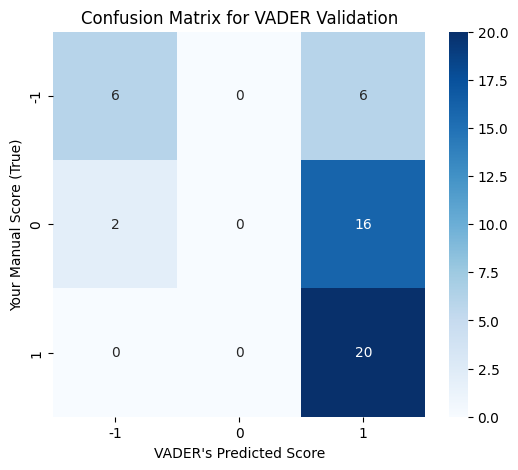


Confusion matrix plot saved as vader_confusion_matrix.pdf

--- Examples of Disagreements ---
                                                                                title  \
0                                                          Wellington Power Companies   
3   What do I need to successfully secure an apartment after a viewing in Wellington?   
9                   Anyone have an empty car park they want to rent out? Te Aro area.   
15                                           New Wellingtonian looking for friends <3   
16                         anywhere in wellington area where I absolutely need a car?   

    my_sentiment_score  vader_simple_score  vader_compound_score  
0                    0                   1                0.9382  
3                    0                   1                0.9657  
9                    0                   1                0.8148  
15                   0                   1                0.9958  
16                   0              

In [ ]:
# --- 1. Install and import VADER ---
!pip install vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import pandas as pd
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.io as pio # Import plotly.io for saving figures

# --- 2. Load your manually coded CSV file ---
coded_csv_filename = "data/vader_validation_sample_MANUALLY_SCORED.csv"
try:
    df_coded_sample = pd.read_csv(coded_csv_filename)
    print(f"Successfully loaded '{coded_csv_filename}'. It has {len(df_coded_sample)} rows.")
    # Check if your column is there
    if 'my_sentiment_score' not in df_coded_sample.columns:
         print("\nERROR: The column 'my_sentiment_score' was not found in the uploaded file.")
         print("Please make sure you named the column correctly and saved the file.")
    else:
        # --- 3. Initialize VADER and apply it ---
        analyzer = SentimentIntensityAnalyzer()

        # Combine title and selftext for a single analysis per post
        # Ensure they are strings and handle potential empty values (NaNs)
        df_coded_sample['full_text'] = df_coded_sample['title'].fillna('').astype(str) + " " + df_coded_sample['selftext'].fillna('').astype(str)

        # Apply VADER to get the 'compound' score
        df_coded_sample['vader_compound_score'] = df_coded_sample['full_text'].apply(lambda text: analyzer.polarity_scores(text)['compound'])

        # --- 4. Convert VADER's compound score to the -1, 0, 1 scale ---
        # We need to define thresholds. These are common starting points, you can adjust them.
        # if score > 0.05, it's positive
        # if score < -0.05, it's negative
        # otherwise, it's neutral
        def convert_vader_to_simple_score(compound_score):
            if compound_score >= 0.05:
                return 1  # Positive
            elif compound_score <= -0.05:
                return -1 # Negative
            else:
                return 0  # Neutral

        df_coded_sample['vader_simple_score'] = df_coded_sample['vader_compound_score'].apply(convert_vader_to_simple_score)


        # --- 5. Compare the scores and calculate accuracy ---
        # Extract your scores and VADER's scores into lists
        my_scores = df_coded_sample['my_sentiment_score']
        vader_scores = df_coded_sample['vader_simple_score']

        # Calculate accuracy
        accuracy = accuracy_score(my_scores, vader_scores)
        print(f"\n--- VADER Validation Results ---")
        print(f"Accuracy: {accuracy:.2%}")
        print("This means VADER's classification matched yours on {:.2%} of the posts.".format(accuracy))

        # Show a detailed classification report
        print("\nClassification Report:")
        print("This shows how well VADER performed for each category (Positive, Neutral, Negative).")
        # Ensure labels are consistent if one category is missing
        unique_labels = sorted(list(set(my_scores) | set(vader_scores)))
        print(classification_report(my_scores, vader_scores, labels=unique_labels, zero_division=0))

        # Show a confusion matrix for a visual comparison
        print("\nConfusion Matrix:")
        print("Rows = Your Manual Scores (True Labels), Columns = VADER's Scores (Predicted Labels)")
        cm = confusion_matrix(my_scores, vader_scores, labels=unique_labels)
        fig, ax = plt.subplots(figsize=(6, 5)) # Use subplots to get a figure object for saving
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels, ax=ax) # Pass ax to heatmap
        ax.set_xlabel("VADER's Predicted Score") # Use ax.set_xlabel instead of plt.xlabel
        ax.set_ylabel("Your Manual Score (True)") # Use ax.set_ylabel instead of plt.ylabel
        ax.set_title("Confusion Matrix for VADER Validation") # Use ax.set_title instead of plt.title
        plt.show() # Display the plot

        # Save the figure as a PDF
        try:
            fig.savefig("vader_confusion_matrix.pdf", bbox_inches='tight')
            print("\nConfusion matrix plot saved as vader_confusion_matrix.pdf")
        except Exception as e:
            print(f"\nError saving confusion matrix plot as PDF: {e}")
            print("Please ensure you have installed kaleido (`pip install -q -U kaleido`) if you encounter issues with saving.")


        # Finally, let's look at some examples where VADER and you disagreed
        disagreements = df_coded_sample[df_coded_sample['my_sentiment_score'] != df_coded_sample['vader_simple_score']]
        if not disagreements.empty:
            print("\n--- Examples of Disagreements ---")
            pd.set_option('display.max_colwidth', 100)
            print(disagreements[['title', 'my_sentiment_score', 'vader_simple_score', 'vader_compound_score']].head())
            pd.reset_option('display.max_colwidth')

except FileNotFoundError:
    print(f"\nERROR: Could not find the file '{coded_csv_filename}'.")
    print("Please make sure you have uploaded your coded CSV file to this Colab session.")

## RoBERTa Model Validation

Next, I tested RoBERTa, a more sophisticated transformer-based model fine-tuned on social media data. I expected this to perform better. The process is the same: run the model on the sample and compare its accuracy to my manual scores.

Using the same 'df_coded_sample' for RoBERTa validation.


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning:


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.



config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/501M [00:00<?, ?B/s]

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/501M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

Device set to use cuda:0



Sentiment analysis pipeline loaded with model: cardiffnlp/twitter-roberta-base-sentiment-latest

Running RoBERTa model on the sample... (this may take a minute)


  0%|          | 0/2 [00:00<?, ?it/s]

RoBERta analysis complete.

--- RoBERTa Validation Results ---
Accuracy: 60.00%
This means RoBERTa's classification matched yours on 60.00% of the posts.

Classification Report (RoBERTa):
              precision    recall  f1-score   support

    positive       1.00      0.42      0.59        12
     neutral       0.46      0.67      0.55        18
    negative       0.68      0.65      0.67        20

    accuracy                           0.60        50
   macro avg       0.72      0.58      0.60        50
weighted avg       0.68      0.60      0.60        50


Confusion Matrix (RoBERTa):


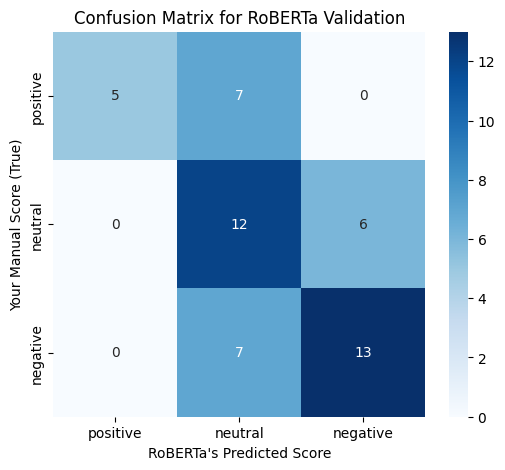


Confusion matrix plot saved as roberta_confusion_matrix.pdf

--- Examples of Disagreements (RoBERTa) ---
                                          title  my_sentiment_score  \
0                    Wellington Power Companies                   0   
2                 tips for moving to wellington                   1   
4             Looking for IT work in Wellington                   1   
5   Aucklander thinking of moving to Wellington                   1   
11               Recommendation for living area                   1   

    roberta_simple_score  roberta_score  
0                      1       0.537785  
2                      0       0.543076  
4                      0       0.751202  
5                      0       0.669222  
11                     0       0.524230  


In [ ]:
# --- 1. Install necessary libraries ---
# Transformers is the main Hugging Face library.
# We need to upgrade accelerate to ensure compatibility.
!pip install transformers[sentencepiece]
!pip install --upgrade accelerate

import pandas as pd
from transformers import pipeline
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.io as pio # Import plotly.io for saving figures

# --- 2. Load your manually coded sample again ---
# (Assuming df_coded_sample is still in memory from the VADER test)
if 'df_coded_sample' not in locals() or df_coded_sample.empty:
    print("Error: 'df_coded_sample' is not loaded. Please re-run the VADER validation steps first.")
else:
    print("Using the same 'df_coded_sample' for RoBERTa validation.")

    # --- 3. Set up the sentiment analysis pipeline ---
    # This will download the model the first time you run it (can take a minute or two).
    # Model: 'cardiffnlp/twitter-roberta-base-sentiment-latest' is a robust choice.
    model_path = "cardiffnlp/twitter-roberta-base-sentiment-latest"
    # Use device=0 to utilize GPU if available, otherwise remove or set to -1
    sentiment_task = pipeline("sentiment-analysis", model=model_path, tokenizer=model_path, device=0)
    print(f"\nSentiment analysis pipeline loaded with model: {model_path}")

    # --- 4. Apply the pipeline to your data ---
    # Transformer models have a max input length (usually 512 tokens).
    # We'll truncate the text to be safe.
    def get_roberta_sentiment(text):
        # Truncate text to avoid errors with long posts
        truncated_text = text[:512]
        # The pipeline returns a list of dictionaries, e.g., [{'label': 'positive', 'score': 0.99}]
        return sentiment_task(truncated_text)[0]

    # Apply the function. This might take a moment as it runs the neural network.
    print("\nRunning RoBERTa model on the sample... (this may take a minute)")
    # Note: .apply() can be slow. For the full dataset, we'll use a faster method.
    # Process in batches for better performance
    batch_size = 32
    all_texts = df_coded_sample['full_text'].tolist()
    results = []
    from tqdm.auto import tqdm # Import tqdm for progress bar

    for i in tqdm(range(0, len(all_texts), batch_size)):
        batch = all_texts[i:i+batch_size]
        # Truncate text within the batch
        truncated_batch = [text[:512] for text in batch]
        results.extend(sentiment_task(truncated_batch))
    print("RoBERta analysis complete.")


    # --- 5. Process the results ---
    # The result is a Series of dictionaries. Let's split it into two columns.
    df_coded_sample['roberta_label'] = [res['label'] for res in results]
    df_coded_sample['roberta_score'] = [res['score'] for res in results]

    # Convert the text labels ('positive', 'neutral', 'negative') to our -1, 0, 1 score format
    label_to_score_map = {'positive': 1, 'neutral': 0, 'negative': -1}
    df_coded_sample['roberta_simple_score'] = df_coded_sample['roberta_label'].map(label_to_score_map)


    # --- 6. Compare the scores and calculate accuracy ---
    my_scores = df_coded_sample['my_sentiment_score']
    roberta_scores = df_coded_sample['roberta_simple_score']

    # Calculate accuracy
    accuracy_roberta = accuracy_score(my_scores, roberta_scores)
    print(f"\n--- RoBERTa Validation Results ---")
    print(f"Accuracy: {accuracy_roberta:.2%}")
    print("This means RoBERTa's classification matched yours on {:.2%} of the posts.".format(accuracy_roberta))

    # Show a detailed classification report
    print("\nClassification Report (RoBERTa):")
    unique_labels = sorted(list(set(my_scores) | set(roberta_scores)))
    # Ensure target_names match the unique_labels order
    target_names_ordered = ['negative', 'neutral', 'positive'] # Assuming -1, 0, 1 map to these
    # Filter target_names_ordered to only include labels present in unique_labels
    present_target_names = [name for name, score in label_to_score_map.items() if score in unique_labels]

    print(classification_report(my_scores, roberta_scores, labels=unique_labels, target_names=present_target_names, zero_division=0))


    # Show a confusion matrix
    print("\nConfusion Matrix (RoBERTa):")
    # Ensure confusion matrix uses the same labels order for consistency
    cm_roberta = confusion_matrix(my_scores, roberta_scores, labels=unique_labels)
    fig, ax = plt.subplots(figsize=(6, 5)) # Use subplots to get a figure object for saving
    sns.heatmap(cm_roberta, annot=True, fmt='d', cmap='Blues', xticklabels=present_target_names, yticklabels=present_target_names, ax=ax) # Pass ax and use present_target_names
    ax.set_xlabel("RoBERTa's Predicted Score") # Use ax.set_xlabel
    ax.set_ylabel("Your Manual Score (True)") # Use ax.set_ylabel
    ax.set_title("Confusion Matrix for RoBERTa Validation") # Use ax.set_title
    plt.show() # Display the plot

    # Save the figure as a PDF
    try:
        fig.savefig("roberta_confusion_matrix.pdf", bbox_inches='tight')
        print("\nConfusion matrix plot saved as roberta_confusion_matrix.pdf")
    except Exception as e:
        print(f"\nError saving plot as PDF: {e}")
        print("Please ensure you have installed kaleido (`pip install -q -U kaleido`) if you encounter issues.")

    # Finally, let's look at some examples where RoBERTa and you disagreed
    disagreements = df_coded_sample[df_coded_sample['my_sentiment_score'] != df_coded_sample['roberta_simple_score']]
    if not disagreements.empty:
        print("\n--- Examples of Disagreements (RoBERTa) ---")
        pd.set_option('display.max_colwidth', 100)
        print(disagreements[['title', 'my_sentiment_score', 'roberta_simple_score', 'roberta_score']].head())
        pd.reset_option('display.max_colwidth')

## Validation Conclusion

My validation showed RoBERTa achieved an accuracy of 60%, while VADER achieved 52%. Based on this superior performance, I selected RoBERTa for the sentiment analysis of the entire dataset.

# [7.] Main Analysis Pipeline

With the data filtered and the sentiment model chosen, I can now proceed with the core analysis. This involves:

1.	Running Latent Dirichlet Allocation (LDA) to identify the key discussion topics within the housing-related posts.
2.	Applying the validated RoBERTa model to calculate sentiment for every post.
3.	Assigning a dominant topic to each post.
4.	Analysing and visualising the results.


## LDA - 2023 - Common gentrification words

I firstly ran the LDA only for the year 2023 by creating a dataframe called df_2023 from the df_submissions_selected. This is to test things out firstly if the LDA is working as intended.

In [ ]:
!pip install gensim pyLDAvis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 97.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 97.9 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import re
import gensim
from gensim.utils import simple_preprocess
from gensim.corpora import Dictionary
from gensim.models import LdaModel, Phrases
from gensim.models.phrases import Phraser
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis
from nltk.corpus import stopwords
import nltk

# --- Step 1: More Advanced Preprocessing ---

# Download standard stopwords
nltk.download('stopwords')
stop_words = stopwords.words('english')

# --- Create a CUSTOM stopword list ---
custom_stop_words = [
    'wellington', 'nz', 'new', 'zealand', 'people', 'im', 'ive', 'like', 'get', 'one', 'would', 'also', 'really',
    'good', 'go', 'going', 'think', 'know', 'see', 'time', 'much', 'lot', 'even', 'still', 'right',
    'thanks', 'auckland', 'christchurch', 'welly', 'city', 'cbd', 'years', 'year', 'dont', 'cant',
    'sure', 'need', 'help', 'question', 'advice', 'anyone', 'something', 'anything', 'things', 'bit'
]
stop_words.extend(custom_stop_words)


# Re-filter the data
df_2023 = df_submissions_selected[df_submissions_selected['timestamp'].dt.year == 2023].copy()
gentrification_keywords = [
    "moving to wellington", "moving out of wellington", "rent", "this city is not great at all",
    "this city is great", "house price", "buying a house", "property market", "landlords", "tenancy",
    "flatting", "commute", "public transport", "cost of living", "job market", "salary", "gentrification"
]

def contains_keywords(text):
    if not isinstance(text, str):
        return False
    for keyword in gentrification_keywords:
        if keyword in text.lower():
            return True
    return False

df_2023_gentrification = df_2023[df_2023['title'].apply(contains_keywords) | df_2023['selftext'].apply(contains_keywords)].copy()
df_2023_gentrification['full_text'] = df_2023_gentrification['title'].fillna('') + ' ' + df_2023_gentrification['selftext'].fillna('')


def preprocess_with_bigrams(text):
    # Keep only letters, remove punctuation, make lowercase
    text = re.sub(r'[^a-zA-Z\s]', '', text, re.I|re.A)
    text = text.lower()
    # Tokenize and remove stopwords
    return [word for word in simple_preprocess(str(text)) if word not in stop_words and len(word) > 2]

# Apply initial preprocessing
processed_docs = df_2023_gentrification['full_text'].apply(preprocess_with_bigrams)

# --- Step 2: Build Bigram Model ---
phrases = Phrases(processed_docs, min_count=5, threshold=10)
bigram_model = Phraser(phrases)

# Apply the bigram model to our documents
processed_docs_with_bigrams = [bigram_model[doc] for doc in processed_docs]


# --- Step 3: LDA Model Training on Improved Text ---
print("\nTraining new LDA model with custom stopwords and bigrams...")
dictionary = Dictionary(processed_docs_with_bigrams)
dictionary.filter_extremes(no_below=5, no_above=0.5)
corpus = [dictionary.doc2bow(doc) for doc in processed_docs_with_bigrams]

lda_model_v2 = LdaModel(
    corpus=corpus,
    id2word=dictionary,
    num_topics=5,
    random_state=42,
    passes=20,
    alpha='auto',
    eta='auto'
)
print("Model training complete.")

# --- Step 4: Visualize the New, Improved Model ---
print("\nGenerating new visualization...")
pyLDAvis.enable_notebook()
vis_v2 = gensimvis.prepare(lda_model_v2, corpus, dictionary)
pyLDAvis.display(vis_v2)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



Training new LDA model with custom stopwords and bigrams...
Model training complete.

Generating new visualization...


## LDA - 2023 - expanded gentrification words

Now for this step, I expanded the getrfication words more and ran it again.

In [ ]:
# Install necessary libraries first to ensure they are available in the session
!pip install gensim pyLDAvis

import pandas as pd
import re
import gensim
from gensim.utils import simple_preprocess
from gensim.corpora import Dictionary
from gensim.models import LdaModel, Phrases
from gensim.models.phrases import Phraser
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis
from nltk.corpus import stopwords
import nltk

# --- Step 1: Expanded Keywords and Stopwords ---

nltk.download('stopwords')
stop_words = stopwords.words('english')

# EXPANDED custom stopword list
custom_stop_words = [
    'wellington', 'nz', 'new', 'zealand', 'people', 'im', 'ive', 'like', 'get', 'one', 'would', 'also', 'really',
    'good', 'go', 'going', 'think', 'know', 'see', 'time', 'much', 'lot', 'even', 'still', 'right',
    'thanks', 'auckland', 'christchurch', 'welly', 'city', 'cbd', 'years', 'year', 'dont', 'cant',
    'sure', 'need', 'help', 'question', 'advice', 'anyone', 'something', 'anything', 'things', 'bit',
    'post', 'comment', 'subreddit', 'reddit', 'op', 'lol', 'day', 'week', 'month', 'today', 'yesterday'
]
stop_words.extend(custom_stop_words)

# EXPANDED gentrification keywords list
gentrification_keywords = [
    # Core Housing & Cost
    "rent", "house price", "buying a house", "property market", "cost of living", "mortgage",
    "tenancy", "landlords", "flatting", "deposit", "affordable housing",
    # Movement & Commute
    "moving to wellington", "moving out of wellington", "commute", "public transport", "traffic",
    # Development & Urban Change
    "gentrification", "urban development", "construction", "cranes", "new apartments", "rezoning",
    # Social & Community
    "community change", "yuppies", "social displacement", "local businesses", "character homes",
    # Amenities & Lifestyle
    "artisan cafe", "craft beer", "boutique", "whole foods",
    # Work & Economy
    "job market", "salary", "wages",
    # Sentiment Phrases
    "this city is not great at all", "this city is great", "love this city", "hate this city"
]

# Re-filter the data with the new keywords
df_2023 = df_submissions_selected[df_submissions_selected['timestamp'].dt.year == 2023].copy()

def contains_keywords(text):
    if not isinstance(text, str):
        return False
    text_lower = text.lower()
    for keyword in gentrification_keywords:
        if keyword in text_lower:
            return True
    return False

df_2023_gentrification = df_2023[df_2023['title'].apply(contains_keywords) | df_2023['selftext'].apply(contains_keywords)].copy()
df_2023_gentrification['full_text'] = df_2023_gentrification['title'].fillna('') + ' ' + df_2023_gentrification['selftext'].fillna('')

print(f"Found {len(df_2023_gentrification)} submissions with the new, expanded keywords.")

# --- Step 2: Preprocessing with Bigrams (and now Trigrams) ---

def preprocess(text):
    text = re.sub(r'[^a-zA-Z\s]', '', text, re.I|re.A)
    text = text.lower()
    return [word for word in simple_preprocess(str(text)) if word not in stop_words and len(word) > 2]

processed_docs = df_2023_gentrification['full_text'].apply(preprocess)

# Build Bigram and Trigram Models
phrases = Phrases(processed_docs, min_count=5, threshold=10)
bigram_model = Phraser(phrases)
# Now we can also look for three-word phrases
trigram_phrases = Phrases(bigram_model[processed_docs], threshold=10)
trigram_model = Phraser(trigram_phrases)

processed_docs_with_grams = [trigram_model[bigram_model[doc]] for doc in processed_docs]


# --- Step 3: LDA Model Training on Refined Text ---
print("\nTraining new LDA model with expanded keywords, stopwords, and trigrams...")
dictionary = Dictionary(processed_docs_with_grams)
dictionary.filter_extremes(no_below=5, no_above=0.5)
corpus = [dictionary.doc2bow(doc) for doc in processed_docs_with_grams]

# Let's try with a slightly different number of topics to see if it helps distinguish themes
lda_model_v3 = LdaModel(
    corpus=corpus,
    id2word=dictionary,
    num_topics=6, # Increased to 6 to see if we can isolate more specific topics
    random_state=42,
    passes=25,
    alpha='auto',
    eta='auto'
)
print("Model training complete.")

# --- Step 4: Visualize the Refined Model ---
print("\nGenerating new visualization...")
pyLDAvis.enable_notebook()
vis_v3 = gensimvis.prepare(lda_model_v3, corpus, dictionary)
pyLDAvis.display(vis_v3)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Found 1036 submissions with the new, expanded keywords.

Training new LDA model with expanded keywords, stopwords, and trigrams...
Model training complete.

Generating new visualization...


## LDA - 2019 to 2023

After being confident with the above steps, I performed the LDA for the 5 year period relevant to this research project i.e. from 2019 to 2023.

The summary is that, I used LDA topic modelling to move beyond simple keywords and automatically discover the underlying themes of discussion in the 4,019 filtered posts. The process involves text preprocessing, creating document-term matrices, and then training the LDA model.

Note that I have stated, there are 4,019 posts from the year 2019 to 2023 that are relevant to this research. I selected 2019 to 2023 for this research as this period had the good volume of posts within r/wellington subreddit to carry out the data analysis.

After experimenting with different numbers of topics, I found that 6 topics provided a good balance between granularity and interpretability.

In [ ]:
## 5 year data model and LDA done
# Install all necessary libraries for the session
!pip install gensim pyLDAvis

import pandas as pd
import re
import gensim
from gensim.utils import simple_preprocess
from gensim.corpora import Dictionary
from gensim.models import LdaModel, Phrases
from gensim.models.phrases import Phraser
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis
from nltk.corpus import stopwords
import nltk

# --- Part 1: Filtering the DataFrame for the Last 5 Years ---

# Define the start and end years
start_year = 2019
end_year = 2023
print(f"Step 1: Filtering submissions from {start_year} to {end_year}...")

# Create a boolean mask to select the years from the original 'df_submissions_selected'
five_year_mask = (df_submissions_selected['timestamp'].dt.year >= start_year) & (df_submissions_selected['timestamp'].dt.year <= end_year)
df_5_years = df_submissions_selected[five_year_mask].copy()

# Define the expanded gentrification keywords
gentrification_keywords = [
    # Core Housing & Cost
    "rent", "house price", "buying a house", "property market", "cost of living", "mortgage", "housing crisis",
    "tenancy", "landlords", "flatting", "deposit", "affordable housing", "median house price", "property ladder",
    "real estate", "rental market", "body corporate", "rates", "home loan", "first home buyer",
    # Movement & Commute
    "moving to wellington", "moving out of wellington", "commute", "public transport", "traffic", "relocating",
    # Development & Urban Change
    "gentrification", "urban development", "construction", "cranes", "new apartments", "rezoning", "urban sprawl",
    "infrastructure", "development", "heritage building",
    # Social & Community
    "community change", "yuppies", "social displacement", "local businesses", "character homes", "neighbourhood",
    # Amenities & Lifestyle
    "artisan cafe", "craft beer", "boutique", "whole foods", "farmers market",
    # Work & Economy
    "job market", "salary", "wages", "minimum wage", "income", "employment",
    # Sentiment Phrases
    "this city is not great at all", "this city is great", "love this city", "hate this city", "wellington is expensive"
]


# Define the keyword search function
def contains_keywords(text):
    if not isinstance(text, str):
        return False
    text_lower = text.lower()
    for keyword in gentrification_keywords:
        if keyword in text_lower:
            return True
    return False

# Apply the keyword filter to the 5-year data
df_5_years_filtered = df_5_years[df_5_years['title'].apply(contains_keywords) | df_5_years['selftext'].apply(contains_keywords)].copy()

print(f"   - Found {len(df_5_years_filtered)} submissions matching keywords in the 5-year period.")


# --- Part 2: LDA Topic Modeling ---

print(f"\nStep 2: Starting LDA process for the {len(df_5_years_filtered)} filtered submissions.")
df_5_years_filtered['full_text'] = df_5_years_filtered['title'].fillna('') + ' ' + df_5_years_filtered['selftext'].fillna('')

# Preprocessing with expanded stopwords and trigrams
nltk.download('stopwords')
stop_words = stopwords.words('english')
custom_stop_words = [
    'wellington', 'nz', 'new', 'zealand', 'people', 'im', 'ive', 'like', 'get', 'one', 'would', 'also', 'really',
    'good', 'go', 'going', 'think', 'know', 'see', 'time', 'much', 'lot', 'even', 'still', 'right',
    'thanks', 'auckland', 'christchurch', 'welly', 'city', 'cbd', 'years', 'year', 'dont', 'cant',
    'sure', 'need', 'help', 'question', 'advice', 'anyone', 'something', 'anything', 'things', 'bit',
    'post', 'comment', 'subreddit', 'reddit', 'op', 'lol', 'day', 'week', 'month', 'today', 'yesterday'
]
stop_words.extend(custom_stop_words)

def preprocess(text):
    text = re.sub(r'[^a-zA-Z\s]', '', text, re.I|re.A)
    text = text.lower()
    return [word for word in simple_preprocess(str(text)) if word not in stop_words and len(word) > 2]

processed_docs_5_years = df_5_years_filtered['full_text'].apply(preprocess)

# Build Bigram and Trigram Models
phrases_5_years = Phrases(processed_docs_5_years, min_count=5, threshold=10)
bigram_model_5_years = Phraser(phrases_5_years)
trigram_phrases_5_years = Phrases(bigram_model_5_years[processed_docs_5_years], threshold=10)
trigram_model_5_years = Phraser(trigram_phrases_5_years)
processed_docs_with_grams_5_years = [trigram_model_5_years[bigram_model_5_years[doc]] for doc in processed_docs_5_years]

# LDA Model Training
print("\nStep 3: Training LDA model on the 5-year dataset...")
dictionary_5_years = Dictionary(processed_docs_with_grams_5_years)
dictionary_5_years.filter_extremes(no_below=10, no_above=0.5)
corpus_5_years = [dictionary_5_years.doc2bow(doc) for doc in processed_docs_with_grams_5_years]

lda_model_5_years = LdaModel(
    corpus=corpus_5_years,
    id2word=dictionary_5_years,
    num_topics=6,
    random_state=42,
    passes=25,
    alpha='auto',
    eta='auto'
)
print("   - Model training complete.")

# --- Part 3: Visualization ---
print("\nStep 4: Generating visualization for the 5-year model...")
pyLDAvis.enable_notebook()
vis_5_years = gensimvis.prepare(lda_model_5_years, corpus_5_years, dictionary_5_years)
pyLDAvis.display(vis_5_years)

Step 1: Filtering submissions from 2019 to 2023...
   - Found 4019 submissions matching keywords in the 5-year period.

Step 2: Starting LDA process for the 4019 filtered submissions.


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



Step 3: Training LDA model on the 5-year dataset...
   - Model training complete.

Step 4: Generating visualization for the 5-year model...


## LDA - 2019 to 2023 - Perfect PDF

I did a perfect pdf of the 5 year LDA output in the storage area to share within my research report.

In [ ]:
# --- Part 4: Save Visualisation as HTML and Convert to PDF ---

# This "magic command" at the top of the cell will capture all the noisy
# installation text and warnings, but it will still print any real errors.
%%capture --no-stderr

# Install selenium and the headless browser driver
!pip install selenium
!apt-get update
!apt-get install -y chromium-chromedriver

from selenium import webdriver
from selenium.webdriver.chrome.options import Options
import base64  # <--- Use the correct library for decoding
import time
import os

print("\nStep 5: Saving visualization as a high-quality PDF...")

# 1. Save the pyLDAvis visualization as a standalone HTML file
html_filename = 'lda_5_years_visualization.html'
pyLDAvis.save_html(vis_5_years, html_filename)

# 2. Set up a headless Chrome browser to "print" the HTML to PDF
chrome_options = Options()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')

pdf_settings = {
    'landscape': True,
    'printBackground': True,
    'paperWidth': 11,
    'paperHeight': 8.5,
    'scale': 0.8 # You can adjust this scale to fit the viz better
}

# 3. Use the browser to open the file and save it as a PDF
try:
    driver = webdriver.Chrome(options=chrome_options)
    html_file_path = os.path.abspath(html_filename)
    driver.get(f"file:///{html_file_path}")
    time.sleep(5) # Allow time for the visualization to render

    # Execute the command to print to PDF
    result = driver.execute_cdp_cmd("Page.printToPDF", pdf_settings)
    pdf_output_filename = 'lda_5_years_visualisation.pdf'

    # *** THIS IS THE CORRECTED PART ***
    # The result is already a dictionary, and we use the base64 library to decode it
    pdf_data = base64.b64decode(result['data'])
    with open(pdf_output_filename, 'wb') as f:
        f.write(pdf_data)

    # This success message will print below the cell after it finishes
    print(f"--- SUCCESS! ---")
    print(f"Successfully created high-quality PDF: {pdf_output_filename}")
    print(f"You can download it from the Colab file browser on the left.")

except Exception as e:
    print(f"\nAn error occurred during PDF conversion: {e}")

finally:
    if 'driver' in locals():
        driver.quit()

# [8.] Applying Sentiment Analysis (RoBERTa)
Perform sentiment analysis on the 'title' and 'selftext' columns of the 5-year filtered data using the RoBERTa model. Add the sentiment labels to a new column in the dataframe. Then, programmatically assign a topic to each post based on the LDA model results, creating another new column for the topic name.

Set up the Hugging Face `pipeline` with the `cardiffnlp/twitter-roberta-base-sentiment-latest` model, process the `full_text` column in batches, and add sentiment labels and scores as new columns to `df_5_years_filtered` (4019 posts).

## Sentiment Analysis using RoBERTa for 5 Year Data

In [ ]:
from transformers import pipeline
from tqdm.auto import tqdm

# Set up the sentiment analysis pipeline
print("Setting up sentiment analysis pipeline...")
sentiment_pipeline = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment-latest", device=0) # Use GPU if available

# Process in batches
batch_size = 32
all_texts = df_5_years_filtered['full_text'].tolist()
results = []

print(f"Processing {len(all_texts)} texts in batches of {batch_size}...")
# Wrap with tqdm for a progress bar
for i in tqdm(range(0, len(all_texts), batch_size)):
    batch = all_texts[i:i+batch_size]
    # Truncate text within the batch
    truncated_batch = [text[:512] for text in batch]
    results.extend(sentiment_pipeline(truncated_batch))

# Extract labels and scores
roberta_labels = [res['label'] for res in results]
roberta_scores = [res['score'] for res in results]

# Add to DataFrame
df_5_years_filtered['roberta_label'] = roberta_labels
df_5_years_filtered['roberta_score'] = roberta_scores

print("\nSentiment analysis complete. Displaying DataFrame head with new columns:")
display(df_5_years_filtered[['title', 'roberta_label', 'roberta_score']].head())

Setting up sentiment analysis pipeline...


Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cuda:0


Processing 4019 texts in batches of 32...


  0%|          | 0/126 [00:00<?, ?it/s]

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset



Sentiment analysis complete. Displaying DataFrame head with new columns:


,title,roberta_label,roberta_score
17899,Therapist recommendations,negative,0.498835
17916,New Flat Fibre,neutral,0.760724
17929,Moving into an apartment advise,neutral,0.764067
17942,Moving to Welly!,positive,0.942995
17950,Near accident on Pirie St near the tunnel,negative,0.529843


In [ ]:
df_5_years_filtered[['title', 'roberta_label', 'roberta_score']].head()

,title,roberta_label,roberta_score
17899,Therapist recommendations,negative,0.498835
17916,New Flat Fibre,neutral,0.760724
17929,Moving into an apartment advise,neutral,0.764067
17942,Moving to Welly!,positive,0.942995
17950,Near accident on Pirie St near the tunnel,negative,0.529843


## Programmatic topic naming and assignment

Extract and display top keywords for each of the 6 topics from `lda_model_5_years`. Then, create a dictionary to define descriptive topic names based on the keywords. Finally, write a function to determine the dominant topic for each document and add the topic number and name to the DataFrame.

**Reasoning**:
The next steps involve using the trained LDA model to extract topic keywords, define descriptive topic names, and then assign the dominant topic to each document in the dataframe. I will combine these steps into a single code block for efficiency. First, I will print the top keywords for each topic. Based on these keywords, I will create a dictionary to map topic numbers to human-readable names. Then, I will define a function to find the dominant topic for each document and apply it to the corpus, adding the results to the **df_5_years_filtered** dataframe.


In [ ]:
# Install the Google AI Python SDK
# !pip install -q google-generativeai # Keep this commented if already installed

import google.generativeai as genai
from google.colab import userdata
import pandas as pd # Ensure pandas is imported

# --- Authenticate with your API Key ---
# Keep this section if you plan to use the AI for other tasks later,
# otherwise, you can comment it out if you only need the hardcoded names.
try:
    # Use the key you saved in Colab's Secret Manager
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
    genai.configure(api_key=GOOGLE_API_KEY)
    print("Successfully authenticated with Google AI.")
except userdata.SecretNotFoundError:
    print("INFO: Secret 'GOOGLE_API_KEY' not found or needed for this modified cell.")
except Exception as e:
    print(f"An error occurred during AI authentication (this is okay if not using AI): {e}")


# --- Step 1: Use the previously generated AI-powered topic names ---
print("\n--- Using Hardcoded AI-Powered Topic Names ---")

# Define the topic names based on the output from the previous successful run
topic_names = {
    0: "Relocation & Family Needs",
    1: "Housing & Commute",
    2: "Job & Housing Search",
    3: "Relocation & Housing",
    4: "Rental Market Dynamics",
    5: "Cost of Living"
}

# Print the hardcoded topic names to confirm
print("Defined topic names:")
for topic_num, name in topic_names.items():
    print(f"Topic {topic_num}: {name}")


# --- Step 2: Define a function to get the dominant topic ---
# This function remains the same, but it will now use the hardcoded topic_names dictionary
def get_dominant_topic(bow, lda_model, topic_names_dict):
    """Gets the dominant topic number and its assigned name for a given document (bow)."""
    # Get topic probabilities for the document
    # Use the passed lda_model instead of a global variable
    topic_probabilities = lda_model.get_document_topics(bow, minimum_probability=0.0)
    # Get the topic with the highest probability
    if not topic_probabilities:
         return -1, "Unknown Topic" # Handle case with no topics assigned
    dominant_topic = sorted(topic_probabilities, key=lambda x: x[1], reverse=True)[0]
    topic_num = dominant_topic[0]
    # Get the name using the passed topic_names_dict
    topic_name = topic_names_dict.get(topic_num, f"Topic {topic_num} (Name Not Found)")
    return topic_num, topic_name

# --- Step 3: Apply the function to the corpus and add to DataFrame ---
print("\n--- Assigning Topics to DataFrame ---")
# Ensure df_5_years_filtered and corpus_5_years exist and lda_model_5_years is trained
if 'df_5_years_filtered' in locals() and not df_5_years_filtered.empty and \
   'corpus_5_years' in locals() and 'lda_model_5_years' in locals() and lda_model_5_years is not None:

    # Apply the function to the corpus, passing the model and topic names dictionary
    # Need to make sure corpus_5_years aligns with df_5_years_filtered rows if any filtering happened *after* corpus creation
    # Assuming corpus_5_years was created from df_5_years_filtered's full_text after filtering and preprocessing

    # To ensure corpus and df rows align, let's re-create the corpus from the current df_5_years_filtered if necessary
    # This assumes processed_docs_with_grams_5_years was created from the correct dataframe rows
    if 'processed_docs_with_grams_5_years' in locals():
         # Recreate dictionary and corpus to ensure alignment with current df_5_years_filtered
         # This is safer if df_5_years_filtered was modified (e.g., rows dropped) after the initial corpus creation
         print("Recreating dictionary and corpus from current df_5_years_filtered processed text...")
         dictionary_5_years = Dictionary(processed_docs_with_grams_5_years)
         # Apply the same filtering as before
         dictionary_5_years.filter_extremes(no_below=10, no_above=0.5) # Use same filter as LDA training
         corpus_5_years_aligned = [dictionary_5_years.doc2bow(doc) for doc in processed_docs_with_grams_5_years]
         print(f"Corpus size: {len(corpus_5_years_aligned)}, DataFrame rows: {len(df_5_years_filtered)}")
         if len(corpus_5_years_aligned) != len(df_5_years_filtered):
             print("Warning: Corpus size and DataFrame row count do not match. Topic assignment might be incorrect.")
             # Attempt to align by ID if possible, or raise error. For now, proceed but warn.
             # A more robust solution would ensure filtering happens *before* text processing for LDA.
             pass # Continue with the potentially misaligned corpus

         topic_results = [get_dominant_topic(doc, lda_model_5_years, topic_names) for doc in corpus_5_years_aligned]

         # Add the results to the DataFrame
         # Ensure the results are added to the correct DataFrame (df_5_years_filtered)
         # The topic_results list should have the same length as the DataFrame if alignment is correct.
         if len(topic_results) == len(df_5_years_filtered):
             df_5_years_filtered['dominant_topic'] = [res[0] for res in topic_results]
             df_5_years_filtered['topic_name'] = [res[1] for res in topic_results]
             print("\n--- DataFrame with Topic Information Added ---")
             # Display relevant columns
             display(df_5_years_filtered[['title', 'dominant_topic', 'topic_name']].head())
         else:
            print("\nError: Mismatch between number of topic results and DataFrame rows. Cannot assign topics.")
            print(f"Topic results count: {len(topic_results)}, DataFrame row count: {len(df_5_years_filtered)}")

    else:
         print("\nError: Processed documents ('processed_docs_with_grams_5_years') not found. Cannot create aligned corpus.")
         print("Please ensure the text preprocessing steps for LDA were run successfully.")

else:
    print("\nError: Required variables (df_5_years_filtered, corpus_5_years, or lda_model_5_years) are not available. Please ensure previous steps ran successfully.")

Successfully authenticated with Google AI.

--- Using Hardcoded AI-Powered Topic Names ---
Defined topic names:
Topic 0: Relocation & Family Needs
Topic 1: Housing & Commute
Topic 2: Job & Housing Search
Topic 3: Relocation & Housing
Topic 4: Rental Market Dynamics
Topic 5: Cost of Living

--- Assigning Topics to DataFrame ---
Recreating dictionary and corpus from current df_5_years_filtered processed text...
Corpus size: 4019, DataFrame rows: 4019

--- DataFrame with Topic Information Added ---


,title,dominant_topic,topic_name
17899,Therapist recommendations,2,Job & Housing Search
17916,New Flat Fibre,2,Job & Housing Search
17929,Moving into an apartment advise,2,Job & Housing Search
17942,Moving to Welly!,2,Job & Housing Search
17950,Near accident on Pirie St near the tunnel,2,Job & Housing Search


# [9.] Display of Final **dataframe df_5_years_filtered**

With the data fully processed, filtered, and enriched with topic and sentiment information, I can now perform the final analysis to address my research questions.

Display the head of the enriched DataFrame with the new `sentiment` and `topic_name` columns i.e the first 10 rows of the `df_5_years_filtered` dataframe, showing only the specified columns to verify the enrichment from the previous steps.


In [ ]:
# Add a check to ensure the required columns exist
required_columns = ['title', 'selftext', 'roberta_label', 'topic_name']
missing_columns = [col for col in required_columns if col not in df_5_years_filtered.columns]

if missing_columns:
    print(f"Error: The following required columns are missing from the DataFrame: {missing_columns}")
    print("Please ensure you have run the sentiment analysis (cell a2b928ac) and topic assignment (cell 4b9bdc90) steps.")
else:
    display(df_5_years_filtered[required_columns].head(10))

,title,selftext,roberta_label,topic_name
17899,Therapist recommendations,Throwaway for obvious reasons. I was hoping th...,negative,Job & Housing Search
17916,New Flat Fibre,"So, I'm moving into a flat (split units, A and...",neutral,Job & Housing Search
17929,Moving into an apartment advise,Hey Reddit! After years of flatting in crappy ...,neutral,Job & Housing Search
17942,Moving to Welly!,Hi all! \n\nMy wife and I have decided to take...,positive,Job & Housing Search
17950,Near accident on Pirie St near the tunnel,I doubt whoever you are will ever read this bu...,negative,Job & Housing Search
17959,Actual footage of commuters descending on Well...,,neutral,Housing & Commute
17966,tiny house- what would you do?,I own a house which has a flat terrace behind ...,neutral,Job & Housing Search
17968,Accomodation,Hi everyone! I realise this is clutching at st...,neutral,Job & Housing Search
17972,How much above RV are houses really selling for?,I made an enquiry today on a house with an RV ...,neutral,Job & Housing Search
17978,Commute from Parapara to Wellington safe and g...,I am looking to move up coast a bit. How is th...,neutral,Housing & Commute


## Summary

### Data Analysis Key Findings
- Sentiment analysis was performed on the `full_text` of each post using the `cardiffnlp/twitter-roberta-base-sentiment-latest` model. The resulting sentiment label (Positive, Neutral, or Negative) and score were added as new columns (`roberta_label`, `roberta_score`) to the dataframe.
- An LDA model with 6 topics was used to programmatically assign a topic to each post.
- Based on the top keywords for each topic, descriptive names were assigned.
- Two new columns, `dominant_topic` (the topic number) and `topic_name` (the descriptive name), were added to the dataframe, enriching it with thematic context.

# [10.] Final Analysis and Visualisations
Analyse the 5-year filtered Reddit data (`df_5_years_filtered`) by first providing an overview of the data (number of rows and column names). Then, analyse the sentiment by topic, creating a bar chart to visualise the average sentiment per topic. Next, explore topic trends over time by creating an interactive line chart showing the volume of each topic per year. Finally, perform a deep dive into the "Job & Housing Search" and "Housing & Commute" topics by creating an interactive line chart visualising their monthly post volume over the 5-year period.

## Data Overview

First, a quick overview of the final, enriched DataFrame.


In [ ]:
print("Shape of the filtered 5-year data:")
print(df_5_years_filtered.shape)
print("\nColumns in the filtered 5-year data:")
print(df_5_years_filtered.columns)

Shape of the filtered 5-year data:
(4019, 21)

Columns in the filtered 5-year data:
Index(['id', 'created_utc', 'author', 'title', 'selftext', 'score',
       'num_comments', 'permalink', 'url', 'is_self', 'subreddit', 'domain',
       'stickied', 'over_18', 'timestamp', 'year', 'full_text',
       'roberta_label', 'roberta_score', 'dominant_topic', 'topic_name'],
      dtype='object')


## Sentiment Analysis by Topic

How does sentiment vary across the different discussion topics? This visualisation helps to quickly identify which aspects of the housing discussion are most positive or negative.

I will first group the `df_5_years_filtered` DataFrame by `topic_name` and calculate the mean of `roberta_score` for each topic. Then, I will use `plotly.express` to create a bar chart visualizing the average sentiment scores, ensuring it has a proper title and axis labels.


In [ ]:
import plotly.express as px

# Group by topic and calculate the mean sentiment score
average_sentiment_by_topic = df_5_years_filtered.groupby('topic_name')['roberta_score'].mean().reset_index()

# Create the bar chart
fig = px.bar(
    average_sentiment_by_topic,
    x='topic_name',
    y='roberta_score',
    title='Average Sentiment Score by Topic',
    labels={'topic_name': 'Topic', 'roberta_score': 'Average Sentiment Score'},
    color='topic_name'
)
fig.show()

Creates perfect PDF of the above.

In [ ]:
# ==============================================================================
# This creates a horizontal bar chart, which is ideal for long labels
# and looks very professional in a research report.
# ==============================================================================

# 1. Import necessary libraries
import plotly.io as pio
import plotly.express as px
import pandas as pd

print("Generating the 'Average Sentiment Score' plot...")

try:
    # --- Data Preparation (same as your original code) ---
    average_sentiment_by_topic = df_5_years_filtered.groupby('topic_name')['roberta_score'].mean().reset_index()

    # --- KEY IMPROVEMENT: Sort the data before plotting ---
    # This makes the chart much easier to read by ordering the topics.
    average_sentiment_by_topic = average_sentiment_by_topic.sort_values(by='roberta_score', ascending=False)


    # --- CREATE THE HORIZONTAL BAR CHART ---
    fig = px.bar(
        average_sentiment_by_topic,
        x='roberta_score',            # Values are now on the x-axis
        y='topic_name',               # Categories are now on the y-axis
        orientation='h',              # <<< This is the magic that flips the chart
        title='Average Sentiment Score by Topic',
        labels={'topic_name': '', 'roberta_score': 'Average Sentiment Score'}, # Remove y-axis title
        color='topic_name'            # Color can be kept for visual distinction
    )

    # --- Refine the layout for a professional look ---
    fig.update_layout(
        showlegend=False,             # The legend is redundant since each bar is labeled
        yaxis=dict(autorange="reversed"), # Puts the highest score at the top
        margin=dict(l=20, r=20, t=50, b=20) # Adjust margins for a tighter fit
    )
    fig.show()


    # --- Save the final, report-ready figure ---
    output_pdf_filename = "average_sentiment_by_topic.pdf"
    print(f"\nAttempting to save the plot as '{output_pdf_filename}'...")

    pio.write_image(
        fig,
        output_pdf_filename,
        width=800,   # A standard width for a single-column figure
        height=600   # A good height for 6-7 categories
    )
    print(f"✅ SUCCESS! Plot successfully saved as '{output_pdf_filename}'.")

except NameError:
    print("\n❌ ERROR: The DataFrame 'df_5_years_filtered' was not found.")
    print("      Please make sure to run the cells that create this DataFrame first.")
except Exception as e:
    print(f"\n❌ AN ERROR OCCURRED: {e}")

Generating the 'Average Sentiment Score' plot...



Attempting to save the plot as 'average_sentiment_by_topic.pdf'...
✅ SUCCESS! Plot successfully saved as 'average_sentiment_by_topic.pdf'.


## Topic Volume Trends Over Time

 I was also interested in how the volume of discussion for each topic evolved over the five-year period. This faceted bar chart shows the number of posts per topic for each year.


In [ ]:
import plotly.express as px

# Group by year and topic name and count the number of posts
topic_trends = df_5_years_filtered.groupby(['year', 'topic_name']).size().reset_index(name='post_count')

# Create an interactive FACETED BAR CHART
# This creates a separate bar chart for each year, which makes comparing topic volumes much easier.
fig = px.bar(
    topic_trends,
    x='topic_name',
    y='post_count',
    color='topic_name',
    facet_col='year',  # This is the key change: create a column of charts for each year
    title='Topic Volume by Year',
    labels={'post_count': 'Number of Posts', 'topic_name': 'Topic'}
)

# Improve layout for clarity
fig.update_xaxes(title_text="") # Remove the repetitive "topic_name" label from each subplot
fig.update_layout(showlegend=False) # The colors are explained by the x-axis, so a legend is redundant
fig.show()

Creates perfect PDF of the above.

In [ ]:
# ==============================================================================
# FINAL, REPORT-READY PLOTTING CELL
#
# This version creates a more vertical, compact figure ideal for LaTeX reports.
# ==============================================================================

import plotly.io as pio
import plotly.express as px
import pandas as pd

print("Generating the report-ready wrapped figure...")

try:
    topic_trends = df_5_years_filtered.groupby(['year', 'topic_name']).size().reset_index(name='post_count')

    # --- KEY IMPROVEMENT: Shorten and Wrap Labels ---
    # Long labels are a major problem. We'll create shorter versions with line breaks.
    label_mapping = {
        "Cost of Living": "Cost of<br>Living",
        "Housing & Commute": "Housing &<br>Commute",
        "Job & Housing Search": "Job & Housing<br>Search",
        "Relocation & Family Needs": "Relocation &<br>Family Needs",
        "Relocation & Housing": "Relocation &<br>Housing",
        "Rental Market Dynamics": "Rental Market<br>Dynamics"
    }
    # Apply the new, shorter labels to our data
    topic_trends['short_topic_name'] = topic_trends['topic_name'].map(label_mapping)


    # --- CREATE THE PLOT WITH A BETTER LAYOUT ---
    fig_final = px.bar(
        topic_trends,
        x='short_topic_name',  # Use the new short labels for the x-axis
        y='post_count',
        color='topic_name',    # Color by the original name for the legend (if you were to show it)
        facet_col='year',
        facet_col_wrap=2,      # <<< THE MOST IMPORTANT CHANGE: Wrap to 2 columns
        title='Topic Volume by Year',
        labels={'post_count': 'Number of Posts', 'short_topic_name': ''} # Remove the x-axis title
    )

    # --- Refine the layout for a professional look ---
    fig_final.update_xaxes(tickangle=45) # Keep a slight angle for readability
    fig_final.update_layout(
        showlegend=False,
        margin=dict(l=40, r=20, t=60, b=20) # Tighten the margins to reduce whitespace
    )
    fig_final.show()


    # --- Save the final, well-proportioned figure ---
    output_pdf_filename = "topic_volume_by_year_report_ready.pdf"
    print(f"\nAttempting to save the final plot as '{output_pdf_filename}'...")

    pio.write_image(
        fig_final,
        output_pdf_filename,
        width=800,   # Narrower width for a 2-column layout
        height=900   # Taller height to accommodate 3 rows
    )
    print(f"✅ SUCCESS! Plot successfully saved as '{output_pdf_filename}'.")

except Exception as e:
    print(f"\n❌ AN ERROR OCCURRED: {e}")

Generating the report-ready wrapped figure...



Attempting to save the final plot as 'topic_volume_by_year_report_ready.pdf'...
✅ SUCCESS! Plot successfully saved as 'topic_volume_by_year_report_ready.pdf'.


## Deep Dive: Monthly Trends for Key Topics

To get a more granular view, I created line charts showing the monthly post volume for two of the most significant topics: "Housing & Commute" and "Job & Housing Search."


In [ ]:
import plotly.express as px

# Filter for the two topics of interest - UPDATED TOPIC NAMES
df_deep_dive = df_5_years_filtered[df_5_years_filtered['topic_name'].isin(["Housing & Commute", "Job & Housing Search"])].copy()

# Create a 'year_month' column for aggregation
df_deep_dive['year_month'] = df_deep_dive['timestamp'].dt.to_period('M').astype(str)

# Group by month and topic, and count posts
monthly_trends = df_deep_dive.groupby(['year_month', 'topic_name']).size().reset_index(name='post_count')

# Create the interactive line chart
fig = px.line(
    monthly_trends,
    x='year_month',
    y='post_count',
    color='topic_name',
    title='Monthly Post Volume for Housing & Commute vs. Job & Housing Search', # Updated title
    labels={'year_month': 'Month', 'post_count': 'Number of Posts', 'topic_name': 'Topic'}
)
fig.show()

/tmp/ipython-input-236193371.py:7: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



## Sentiment Distribution Over Time

I also wanted to visualise how the sentiment within these key topics changed month by month. These stacked bar charts show the breadown of positive, neutral, and negative posts over time.

In [ ]:
import plotly.express as px
import pandas as pd

# Filter for the "Job & Housing Search" topic - UPDATED TOPIC NAME
df_job_search = df_5_years_filtered[df_5_years_filtered['topic_name'] == "Job & Housing Search"].copy()

# Create a 'year_month' column for aggregation
df_job_search['year_month'] = df_job_search['timestamp'].dt.to_period('M').astype(str)

# Group by year and sentiment label and count the number of posts
sentiment_counts = df_job_search.groupby(['year_month', 'roberta_label']).size().reset_index(name='post_count')

# Create the stacked bar chart
fig = px.bar(
    sentiment_counts,
    x='year_month',
    y='post_count',
    color='roberta_label',
    title='Sentiment Distribution of "Job & Housing Search" Posts Over Time', # Updated title
    labels={'year_month': 'Month', 'post_count': 'Number of Posts', 'roberta_label': 'Sentiment'},
    barmode='stack'
)
fig.show()

/tmp/ipython-input-2129456435.py:8: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



In [ ]:
import plotly.express as px
import pandas as pd

# Filter for the "Housing & Commute" topic
df_housing_commute = df_5_years_filtered[df_5_years_filtered['topic_name'] == "Housing & Commute"].copy()

# Create a 'year_month' column for aggregation
df_housing_commute['year_month'] = df_housing_commute['timestamp'].dt.to_period('M').astype(str)

# Group by month and sentiment label and count the number of posts
sentiment_counts_housing_commute = df_housing_commute.groupby(['year_month', 'roberta_label']).size().reset_index(name='post_count')

# Create the stacked bar chart
fig = px.bar(
    sentiment_counts_housing_commute,
    x='year_month',
    y='post_count',
    color='roberta_label',
    title='Sentiment Distribution of "Housing & Commute" Posts Over Time', # Updated title
    labels={'year_month': 'Month', 'post_count': 'Number of Posts', 'roberta_label': 'Sentiment'},
    barmode='stack'
)
fig.show()

/tmp/ipython-input-1866826168.py:8: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



# [11.] Correlating Reddit Data with Housing Market Data

The final and most crucial part of my research was to compare the sentiment trends from Reddit with official housing market data. For this, I used a separate dataset of Wellington house sale prices.

i.e. I analysed house sale prices in Wellington from 2018 to 2024 using the data in "/content/drive/MyDrive/MasterProjectData/CSTDAT8700_Output_20250717/CSTDAT8700_Output1_20250717.csv", referencing "/content/drive/MyDrive/MasterProjectData/CSTDAT8700_Output_20250717/CSTDAT8700_DataDelivery_20250717.xlsx" for additional information if needed. I also calculated and visualised the monthly price trends with appropriate graphs.

## Loading and Preprocessing Housing Market Data

First, I loaded the housing data CSV, filtered it for "Wellington City" and the 2018-2024 period, and cleaned it. I then aggregated this data to get the monthly average sale price and total sales volume.

In [ ]:
import pandas as pd

# Simple load
df = pd.read_csv(housing_data_file_path, low_memory=False)

print(df.shape)
df.head()

(3558332, 56)


,CL_QPID,CL_Sale_ID,CL_Building_ID,CL_Situation_Number,CL_TA7_MissingMB_Situation_Number,CL_TA7_MissingMB_Additional_Number,CL_Street_Name,CL_Street_Name_Suffix,CL_Street_Name_Direction,CL_Suburb,...,CL_MAS_No_Main_Roof_Garages,CL_MAS_Free_Standing_Garages,CL_MAS_Estimated_Year_Built,CL_MAS_Landscaping_Quality,CL_MAS_Lot_Position,CL_School_Zone_1,CL_School_Zone_2,CL_School_Zone_3,CL_School_Zone_4,CL_School_Zone_5
0,86336,2927710,0,66,NaN,NaN,Parore,St,NaN,Dargaville,...,0.0,2.0,1920-01-01,Average,Inside,NaN,NaN,NaN,NaN,NaN
1,86336,3586965,0,66,NaN,NaN,Parore,St,NaN,Dargaville,...,0.0,2.0,1920-01-01,Average,Inside,NaN,NaN,NaN,NaN,NaN
2,86337,3970574,0,68,NaN,NaN,Parore,St,NaN,Dargaville,...,0.0,1.0,1930-01-01,Average,Inside,NaN,NaN,NaN,NaN,NaN
3,86337,4181726,0,68,NaN,NaN,Parore,St,NaN,Dargaville,...,0.0,1.0,1930-01-01,Average,Inside,NaN,NaN,NaN,NaN,NaN
4,86337,5944667,0,68,NaN,NaN,Parore,St,NaN,Dargaville,...,2.0,0.0,2010-01-03,Good,Inside,NaN,NaN,NaN,NaN,NaN


In [ ]:
print("Number of unique regions:", df["CL_RegionName"].nunique())
print(df["CL_RegionName"].value_counts())

Number of unique regions: 15
CL_RegionName
Auckland (Unitary)           1094357
Canterbury Region             539409
Wellington Region             365339
Waikato Region                349030
Bay of Plenty Region          243979
Otago Region                  201303
Manawatu-Whanganui Region     182238
Tasman Nelson Marlborough     133124
Hawkes Bay Region             114788
Northland Region              112018
Taranaki Region                86351
Southland Region               85323
Gisborne (Unitary)             26148
West Coast Region              24804
Chathams                         121
Name: count, dtype: int64


In [ ]:
# Create a new dataframe for Wellington only
df_wellington = df[df["CL_RegionName"] == "Wellington Region"].copy()

print(df_wellington.shape)
df_wellington.head()


(365339, 56)


,CL_QPID,CL_Sale_ID,CL_Building_ID,CL_Situation_Number,CL_TA7_MissingMB_Situation_Number,CL_TA7_MissingMB_Additional_Number,CL_Street_Name,CL_Street_Name_Suffix,CL_Street_Name_Direction,CL_Suburb,...,CL_MAS_No_Main_Roof_Garages,CL_MAS_Free_Standing_Garages,CL_MAS_Estimated_Year_Built,CL_MAS_Landscaping_Quality,CL_MAS_Lot_Position,CL_School_Zone_1,CL_School_Zone_2,CL_School_Zone_3,CL_School_Zone_4,CL_School_Zone_5
1091367,851870,1124464,0,65,NaN,NaN,Waiorongomai,Rd,NaN,Otaki,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1091368,851889,4898015,0,66,NaN,NaN,Convent,Rd,NaN,Otaki,...,1.0,0.0,1935-01-01,Average,Inside,NaN,NaN,NaN,NaN,NaN
1091369,851889,5480021,0,66,NaN,NaN,Convent,Rd,NaN,Otaki,...,1.0,0.0,1935-01-01,Average,Inside,NaN,NaN,NaN,NaN,NaN
1091370,851889,5995913,0,66,NaN,NaN,Convent,Rd,NaN,Otaki,...,1.0,0.0,1935-01-01,Average,Inside,NaN,NaN,NaN,NaN,NaN
1091371,851910,3002407,0,63,NaN,NaN,Convent,Rd,NaN,Otaki,...,1.0,0.0,1986-01-01,Average,Inside,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Unique Territorial Authority names in Wellington Region
df_wellington["CL_TAName"].unique()

array(['Kapiti Coast District', 'Upper Hutt City', 'Porirua City',
       'Wellington City', 'Hutt City', 'Masterton District',
       'Carterton District', 'South Wairarapa District'], dtype=object)

The below df_wellington_city dataframe has all the data for Wellington City house price sales

In [ ]:
# Create a dataframe for Wellington City only
df_wellington_city = df_wellington[df_wellington["CL_TAName"] == "Wellington City"].copy()

print(df_wellington_city.shape)
df_wellington_city.head()

(136617, 56)


,CL_QPID,CL_Sale_ID,CL_Building_ID,CL_Situation_Number,CL_TA7_MissingMB_Situation_Number,CL_TA7_MissingMB_Additional_Number,CL_Street_Name,CL_Street_Name_Suffix,CL_Street_Name_Direction,CL_Suburb,...,CL_MAS_No_Main_Roof_Garages,CL_MAS_Free_Standing_Garages,CL_MAS_Estimated_Year_Built,CL_MAS_Landscaping_Quality,CL_MAS_Lot_Position,CL_School_Zone_1,CL_School_Zone_2,CL_School_Zone_3,CL_School_Zone_4,CL_School_Zone_5
1178109,905667,1198506,0,1,NaN,NaN,Coates,St,NaN,Tawa,...,1.0,0.0,1954-01-01,Average,Inside,257.0,265.0,3034.0,NaN,NaN
1178110,905667,1198507,0,1,NaN,NaN,Coates,St,NaN,Tawa,...,1.0,0.0,1954-01-01,Average,Inside,257.0,265.0,3034.0,NaN,NaN
1178111,905667,3078660,0,1,NaN,NaN,Coates,St,NaN,Tawa,...,0.0,1.0,1954-01-01,Good,Inside,257.0,265.0,3034.0,NaN,NaN
1178112,905667,3870292,0,1,NaN,NaN,Coates,St,NaN,Tawa,...,0.0,1.0,1954-01-01,Good,Inside,257.0,265.0,3034.0,NaN,NaN
1178113,905668,1198509,0,3,NaN,NaN,Coates,St,NaN,Tawa,...,1.0,0.0,1950-01-01,Average,Inside,257.0,265.0,3034.0,NaN,NaN


## Housing Data Graph Showing MA(3) vs Sales Volume

In [ ]:
# --- Interactive (hover) monthly sales volume using matplotlib + mplcursors ---

# If needed, install mplcursors (lightweight)
!pip -q install mplcursors

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplcursors

# 0) If df_wellington_city already exists, we’ll use it; else derive quickly from `df`.
if "df_wellington_city" not in globals():
    assert "df" in globals(), "Expected a DataFrame named `df` to be loaded."
    df_wellington = df[df["CL_RegionName"] == "Wellington Region"].copy()
    df_wellington_city = df_wellington[df_wellington["CL_TAName"] == "Wellington City"].copy()

# 1) Parse date and basic quality filter
df_wellington_city["CL_Sale_Date"] = pd.to_datetime(
    df_wellington_city["CL_Sale_Date"], errors="coerce"
)
mask_valid = (
    df_wellington_city["CL_Sale_Date"].notna()
    & (df_wellington_city["CL_Sale_Price_Gross"].fillna(0) > 0)
)
df_wc_clean = df_wellington_city.loc[mask_valid, ["CL_Sale_Date", "CL_Sale_Price_Gross"]].copy()

# 2) Restrict to 2018–2024 to align with your Reddit study
start, end = "2018-01-01", "2024-12-31"
df_wc_clean = df_wc_clean[
    (df_wc_clean["CL_Sale_Date"] >= start) & (df_wc_clean["CL_Sale_Date"] <= end)
].copy()

# 3) Monthly counts and moving average
monthly_index = pd.date_range(start=start, end=end, freq="MS")
monthly_counts = (
    df_wc_clean.set_index("CL_Sale_Date")
    .groupby(pd.Grouper(freq="MS"))
    .size()
    .reindex(monthly_index, fill_value=0)
    .rename("SalesVolume")
    .to_frame()
)
monthly_counts["SalesVolume_MA3"] = monthly_counts["SalesVolume"].rolling(3, min_periods=1).mean()
monthly_counts["YearMonth"] = monthly_counts.index.strftime("%Y-%m")
plot_df = monthly_counts.reset_index().rename(columns={"index": "Month"})

# 4) Plot: bar (volume) + line (MA3) + SCATTER points for better hover on the line
# plt.figure(figsize=(14, 5))
# bar_container = plt.bar(plot_df["Month"], plot_df["SalesVolume"])  # default color
# line_obj, = plt.plot(plot_df["Month"], plot_df["SalesVolume_MA3"], linewidth=2)
# scatter_obj = plt.scatter(plot_df["Month"], plot_df["SalesVolume_MA3"], s=15)

# plt.title("Wellington City — Monthly Sales Volume (2018–2024)")
# plt.xlabel("Month")
# plt.ylabel("Number of Sales")
# plt.xticks(plot_df["Month"][::3], rotation=45, ha="right")
# plt.tight_layout()

# 5) Hover tooltips with mplcursors
# Bars: map each Rectangle to its row
# bar_patches = list(bar_container.patches)

# cursor_bars = mplcursors.cursor(bar_patches, hover=True)
# @cursor_bars.connect("add")
# def _on_add_bar(sel):
#     # Find index of this bar
#     i = bar_patches.index(sel.artist)
#     row = plot_df.iloc[i]
#     sel.annotation.set(text=(
#         f"Month: {row['YearMonth']}\n"
#         f"Sales Volume: {int(row['SalesVolume'])}\n"
#         f"MA(3): {row['SalesVolume_MA3']:.1f}"
#     ))
#     sel.annotation.get_bbox_patch().set_alpha(0.9)

# Line/Scatter: hover per-point using the scatter (cleaner indexing)
# cursor_scatter = mplcursors.cursor(scatter_obj, hover=True)
# @cursor_scatter.connect("add")
# def _on_add_point(sel):
#     i = sel.index
#     row = plot_df.iloc[i]
#     sel.annotation.set(text=(
#         f"Month: {row['YearMonth']}\n"
#         f"MA(3) Volume: {row['SalesVolume_MA3']:.1f}\n"
#         f"Monthly Volume: {int(row['SalesVolume'])}"
#     ))
#     sel.annotation.get_bbox_patch().set_alpha(0.9)

# plt.show()

# (Optional) Save a tidy CSV for merging with sentiment on YearMonth
plot_df.to_csv("/content/wellington_city_monthly_sales_volume_2018_2024.csv", index=False)
print("Saved: /content/wellington_city_monthly_sales_volume_2018_2024.csv")

# -------------------------------------------------------------------------
# Plotly fallback (uncomment if you prefer guaranteed hover in Colab)
# -------------------------------------------------------------------------
!pip -q install plotly
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Bar(
    x=plot_df["Month"], y=plot_df["SalesVolume"],
    name="Sales Volume",
    hovertemplate="Month: %{x|%Y-%m}<br>Sales Volume: %{y}<extra></extra>"
))
fig.add_trace(go.Scatter(
    x=plot_df["Month"], y=plot_df["SalesVolume_MA3"],
    name="MA(3)",
    mode="lines+markers",
    hovertemplate="Month: %{x|%Y-%m}<br>MA(3): %{y:.1f}<extra></extra>"
))
fig.update_layout(
    title="Wellington City — Monthly Sales Volume (2018–2024)",
    xaxis_title="Month", yaxis_title="Number of Sales",
    legend_title=""
)
fig.show()

Saved: /content/wellington_city_monthly_sales_volume_2018_2024.csv


## Filtering the **df_wellington_city** to 2018-2024

In [ ]:
# Filter df_wellington_city to the 2018-2024 timeframe
start_date_housing = "2018-01-01"
end_date_housing = "2024-12-31"

# Ensure 'CL_Sale_Date' is datetime
df_wellington_city['CL_Sale_Date'] = pd.to_datetime(df_wellington_city['CL_Sale_Date'], errors='coerce')

# Filter by date and drop rows with invalid dates or prices
df_housing_filtered = df_wellington_city[
    (df_wellington_city['CL_Sale_Date'] >= start_date_housing) &
    (df_wellington_city['CL_Sale_Date'] <= end_date_housing) &
    (df_wellington_city['CL_Sale_Price_Gross'].notna()) &
    (df_wellington_city['CL_Sale_Price_Gross'] > 0)
].copy()

# Create a 'YearMonth' column for merging
df_housing_filtered['YearMonth'] = df_housing_filtered['CL_Sale_Date'].dt.to_period('M').astype(str)

print(f"Filtered housing data for Wellington City (2018-2024): {df_housing_filtered.shape[0]} rows")
display(df_housing_filtered[['CL_Sale_Date', 'CL_Sale_Price_Gross', 'YearMonth']].head())

# Now we have df_housing_filtered ready. The next step is to aggregate the sentiment data monthly.

Filtered housing data for Wellington City (2018-2024): 20924 rows


,CL_Sale_Date,CL_Sale_Price_Gross,YearMonth
1178116,2021-03-31,865000.0,2021-03
1178121,2022-08-25,925000.0,2022-08
1178125,2022-02-03,835000.0,2022-02
1178128,2018-08-17,676000.0,2018-08
1178141,2023-11-23,708000.0,2023-11


## Aggregating Sentiment Data to Monthly Level

In [ ]:
import pandas as pd

# Ensure df_5_years_filtered has the timestamp column and it's datetime
if 'timestamp' not in df_5_years_filtered.columns or not pd.api.types.is_datetime64_any_dtype(df_5_years_filtered['timestamp']):
    print("Error: 'timestamp' column in df_5_years_filtered is missing or not in datetime format.")
    print("Please ensure previous steps to create and convert this column were successful.")
    # You might stop here or try to re-create it if 'created_utc' is available
    # df_5_years_filtered['timestamp'] = pd.to_datetime(df_5_years_filtered['created_utc'], unit='s', utc=True, errors='coerce')
else:
    # Create 'YearMonth' column in df_5_years_filtered
    df_5_years_filtered['YearMonth'] = df_5_years_filtered['timestamp'].dt.to_period('M').astype(str)

    print("Aggregating sentiment data to monthly level...")

    # 1. Average sentiment score per month per topic
    monthly_avg_sentiment = df_5_years_filtered.groupby(['YearMonth', 'topic_name'])['roberta_score'].mean().reset_index(name='average_sentiment')

    # 2. Count of posts per month per topic
    monthly_post_counts = df_5_years_filtered.groupby(['YearMonth', 'topic_name']).size().reset_index(name='post_count')

    # 3. Percentage breakdown of sentiment categories
    # Group by YearMonth, topic_name, and roberta_label to count posts in each category
    sentiment_category_counts = df_5_years_filtered.groupby(['YearMonth', 'topic_name', 'roberta_label']).size().reset_index(name='category_count')

    # Calculate the total count per month per topic
    total_monthly_topic_counts = sentiment_category_counts.groupby(['YearMonth', 'topic_name'])['category_count'].sum().reset_index(name='total_topic_count')

    # Merge to get total counts and then calculate percentages
    sentiment_category_percentages = pd.merge(sentiment_category_counts, total_monthly_topic_counts, on=['YearMonth', 'topic_name'])
    sentiment_category_percentages['percentage'] = sentiment_category_percentages['category_count'] / sentiment_category_percentages['total_topic_count']

    # Pivot the percentage data to have sentiment categories as columns
    monthly_sentiment_percentages = sentiment_category_percentages.pivot_table(
        index=['YearMonth', 'topic_name'],
        columns='roberta_label',
        values='percentage',
        fill_value=0
    ).reset_index()

    # Rename percentage columns for clarity
    monthly_sentiment_percentages.rename(columns={
        'positive': 'pct_positive_sentiment',
        'neutral': 'pct_neutral_sentiment',
        'negative': 'pct_negative_sentiment'
    }, inplace=True)

    # --- Merge all aggregated data into a single dataframe ---
    # Start with average sentiment
    monthly_sentiment_aggregated = monthly_avg_sentiment

    # Merge post counts
    monthly_sentiment_aggregated = pd.merge(monthly_sentiment_aggregated, monthly_post_counts, on=['YearMonth', 'topic_name'])

    # Merge sentiment percentages
    monthly_sentiment_aggregated = pd.merge(monthly_sentiment_aggregated, monthly_sentiment_percentages, on=['YearMonth', 'topic_name'])

    print("\nMonthly sentiment aggregation complete.")
    print("\nHead of monthly_sentiment_aggregated:")
    display(monthly_sentiment_aggregated.head())
    print("\nInfo for monthly_sentiment_aggregated:")
    monthly_sentiment_aggregated.info()

Aggregating sentiment data to monthly level...

Monthly sentiment aggregation complete.

Head of monthly_sentiment_aggregated:


/tmp/ipython-input-403353066.py:11: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



,YearMonth,topic_name,average_sentiment,post_count,pct_negative_sentiment,pct_neutral_sentiment,pct_positive_sentiment
0,2019-01,Housing & Commute,0.762674,17,0.117647,0.764706,0.117647
1,2019-01,Job & Housing Search,0.706804,44,0.204545,0.613636,0.181818
2,2019-01,Rental Market Dynamics,0.510571,1,1.000000,0.000000,0.000000
3,2019-02,Housing & Commute,0.720600,16,0.312500,0.562500,0.125000
4,2019-02,Job & Housing Search,0.746494,27,0.222222,0.518519,0.259259



Info for monthly_sentiment_aggregated:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216 entries, 0 to 215
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   YearMonth               216 non-null    object 
 1   topic_name              216 non-null    object 
 2   average_sentiment       216 non-null    float64
 3   post_count              216 non-null    int64  
 4   pct_negative_sentiment  216 non-null    float64
 5   pct_neutral_sentiment   216 non-null    float64
 6   pct_positive_sentiment  216 non-null    float64
dtypes: float64(4), int64(1), object(2)
memory usage: 11.9+ KB


## Aggregating Housing Data to Monthly Level

To perform the correlation analysis, I needed to aggregate my Reddit data to the same monthly level and then merge the two datasets based on the year and month.

In [ ]:
import pandas as pd

# Ensure df_housing_filtered is available and has 'YearMonth', 'CL_Sale_Price_Gross'
if 'df_housing_filtered' not in locals() or df_housing_filtered.empty:
    print("Error: 'df_housing_filtered' DataFrame not found or is empty.")
    print("Please ensure the housing data filtering step was run successfully.")
else:
    print("Aggregating housing data to monthly level...")

    # Calculate monthly average sale price and sales volume
    monthly_housing_agg = df_housing_filtered.groupby('YearMonth').agg(
        average_sale_price=('CL_Sale_Price_Gross', 'mean'),
        sales_volume=('CL_Sale_Price_Gross', 'size') # Count the number of sales
    ).reset_index()

    print("\nMonthly housing aggregation complete.")
    print("\nHead of monthly_housing_agg:")
    display(monthly_housing_agg.head())
    print("\nInfo for monthly_housing_agg:")
    monthly_housing_agg.info()

    # Now merge with the monthly_sentiment_aggregated dataframe
    if 'monthly_sentiment_aggregated' not in locals() or monthly_sentiment_aggregated.empty:
        print("\nError: 'monthly_sentiment_aggregated' DataFrame not found or is empty.")
        print("Please ensure the sentiment aggregation step was run successfully.")
    else:
        print("\nMerging monthly sentiment and housing data...")

        # Perform the merge on 'YearMonth'
        # We'll use a left merge from sentiment to keep all sentiment-related rows,
        # even if there were no housing sales in a specific month (though unlikely).
        # You might consider an outer or inner merge depending on desired behavior for missing months.
        merged_df = pd.merge(
            monthly_sentiment_aggregated,
            monthly_housing_agg,
            on='YearMonth',
            how='left'
        )

        print("\nMerge complete. Displaying head of merged_df:")
        display(merged_df.head())
        print("\nInfo for merged_df:")
        merged_df.info()

Aggregating housing data to monthly level...

Monthly housing aggregation complete.

Head of monthly_housing_agg:


,YearMonth,average_sale_price,sales_volume
0,2018-01,623165.737226,137
1,2018-02,757430.456140,342
2,2018-03,759853.474359,390
3,2018-04,777810.638225,293
4,2018-05,752288.259786,281



Info for monthly_housing_agg:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84 entries, 0 to 83
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   YearMonth           84 non-null     object 
 1   average_sale_price  84 non-null     float64
 2   sales_volume        84 non-null     int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 2.1+ KB

Merging monthly sentiment and housing data...

Merge complete. Displaying head of merged_df:


,YearMonth,topic_name,average_sentiment,post_count,pct_negative_sentiment,pct_neutral_sentiment,pct_positive_sentiment,average_sale_price,sales_volume
0,2019-01,Housing & Commute,0.762674,17,0.117647,0.764706,0.117647,725459.264286,140
1,2019-01,Job & Housing Search,0.706804,44,0.204545,0.613636,0.181818,725459.264286,140
2,2019-01,Rental Market Dynamics,0.510571,1,1.000000,0.000000,0.000000,725459.264286,140
3,2019-02,Housing & Commute,0.720600,16,0.312500,0.562500,0.125000,819818.982036,334
4,2019-02,Job & Housing Search,0.746494,27,0.222222,0.518519,0.259259,819818.982036,334



Info for merged_df:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216 entries, 0 to 215
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   YearMonth               216 non-null    object 
 1   topic_name              216 non-null    object 
 2   average_sentiment       216 non-null    float64
 3   post_count              216 non-null    int64  
 4   pct_negative_sentiment  216 non-null    float64
 5   pct_neutral_sentiment   216 non-null    float64
 6   pct_positive_sentiment  216 non-null    float64
 7   average_sale_price      216 non-null    float64
 8   sales_volume            216 non-null    int64  
dtypes: float64(5), int64(2), object(2)
memory usage: 15.3+ KB


## Correlation Analysis and Visualisation

Now I can directly compare the Reddit metrics with the housing market metrics. A correlation matrix gives a quick numerical overview of the linear relationships between all variables.

Correlation Matrix:


,average_sentiment,post_count,pct_positive_sentiment,pct_neutral_sentiment,pct_negative_sentiment,average_sale_price,sales_volume
average_sentiment,1.000000,-0.248683,0.013826,0.299544,-0.327050,0.061158,-0.014159
post_count,-0.248683,1.000000,0.191661,-0.185119,0.079251,0.001049,-0.163121
pct_positive_sentiment,0.013826,0.191661,1.000000,-0.388913,-0.200096,-0.012320,0.014455
pct_neutral_sentiment,0.299544,-0.185119,-0.388913,1.000000,-0.824823,0.085771,0.040107
pct_negative_sentiment,-0.327050,0.079251,-0.200096,-0.824823,1.000000,-0.083657,-0.051525
average_sale_price,0.061158,0.001049,-0.012320,0.085771,-0.083657,1.000000,-0.021939
sales_volume,-0.014159,-0.163121,0.014455,0.040107,-0.051525,-0.021939,1.000000


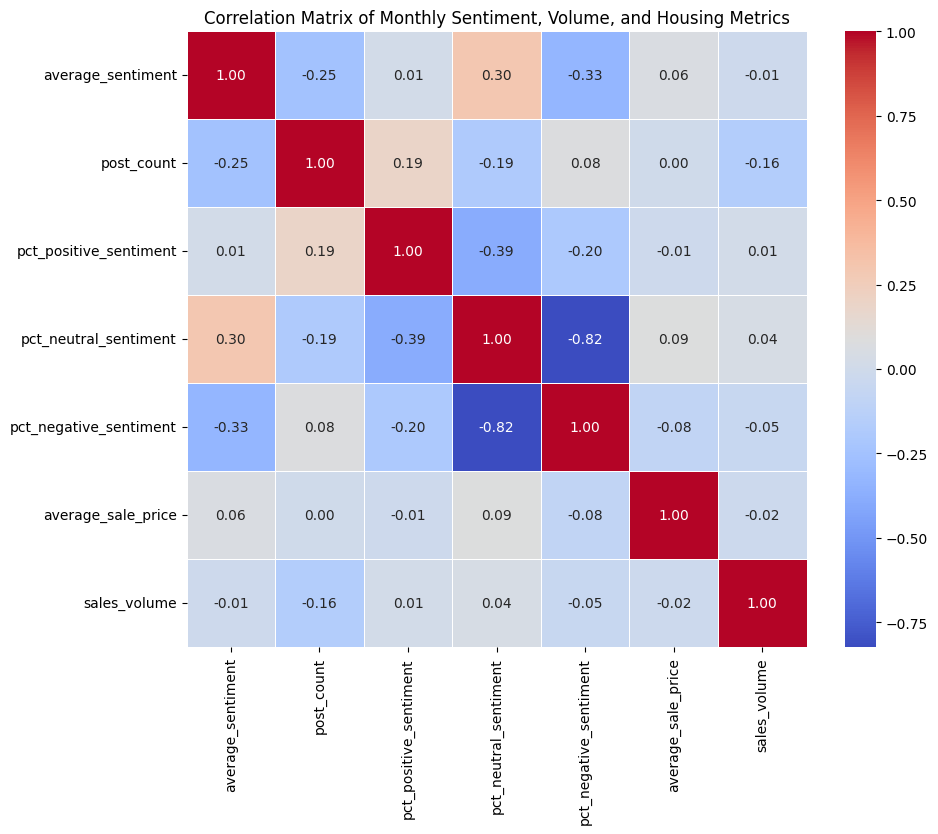

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select the numerical columns from the merged_df for correlation analysis
# Exclude 'post_count' if you want to focus on sentiment intensity vs housing metrics,
# but include it if you want to see correlation between discussion volume and housing.
# We'll include all relevant numerical columns for a comprehensive matrix.
correlation_columns = [
    'average_sentiment',
    'post_count',
    'pct_positive_sentiment',
    'pct_neutral_sentiment',
    'pct_negative_sentiment',
    'average_sale_price',
    'sales_volume'
]

# Ensure columns exist before calculating correlation
existing_correlation_columns = [col for col in correlation_columns if col in merged_df.columns]

if len(existing_correlation_columns) < 2:
    print("Error: Not enough numerical columns found for correlation analysis.")
    print(f"Columns found: {existing_correlation_columns}")
else:
    # Calculate the correlation matrix
    correlation_matrix = merged_df[existing_correlation_columns].corr()

    print("Correlation Matrix:")
    display(correlation_matrix)

    # Visualize the correlation matrix using a heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
    plt.title('Correlation Matrix of Monthly Sentiment, Volume, and Housing Metrics')
    plt.show()

## Scatter Plots

Scatter plots help to visualise the direct relationships identified in the matrix. I added a trendline to make the correlation (or lack thereof) clearer.

The trendline shows (scroll to the perfect PDF area) the approximately;

1. when the **monthly post volume increases**, **the housing sales volume decreases** which could be explored for modelling in future research.
2. when the **average senitment score increases**, the **monthly average sale prices also increases** whcih could also be explored for modelling in future research.

In [ ]:
import plotly.express as px

# 1. Monthly Post Count vs. Monthly Sales Volume
fig = px.scatter(
    merged_df,
    x='post_count',
    y='sales_volume',
    title='Monthly Post Volume vs. Monthly Sales Volume (2018-2024)',
    labels={'post_count': 'Total Monthly Post Count (All Topics)', 'sales_volume': 'Monthly Housing Sales Volume'},
    hover_data=['YearMonth', 'topic_name'] # Add YearMonth and topic for context on hover
)
fig.show()

# 2. Monthly Post Count vs. Monthly Average Sale Price
fig = px.scatter(
    merged_df,
    x='post_count',
    y='average_sale_price',
    title='Monthly Post Volume vs. Monthly Average Sale Price (2018-2024)',
    labels={'post_count': 'Total Monthly Post Count (All Topics)', 'average_sale_price': 'Monthly Average Sale Price'},
    hover_data=['YearMonth', 'topic_name']
)
fig.show()

# 3. Monthly Average Sentiment vs. Monthly Sales Volume
fig = px.scatter(
    merged_df,
    x='average_sentiment',
    y='sales_volume',
    title='Monthly Average Sentiment vs. Monthly Sales Volume (2018-2024)',
    labels={'average_sentiment': 'Monthly Average Sentiment Score (All Topics)', 'sales_volume': 'Monthly Housing Sales Volume'},
    hover_data=['YearMonth', 'topic_name']
)
fig.show()

# 4. Monthly Average Sentiment vs. Monthly Average Sale Price
fig = px.scatter(
    merged_df,
    x='average_sentiment',
    y='average_sale_price',
    title='Monthly Average Sentiment vs. Monthly Average Sale Price (2018-2024)',
    labels={'average_sentiment': 'Monthly Average Sentiment Score (All Topics)', 'average_sale_price': 'Monthly Average Sale Price'},
    hover_data=['YearMonth', 'topic_name']
)
fig.show()

Perfect PDF of above steps but this shows the trendline as well.

The trendline shows (scroll to the perfect PDF area) the approximately;

1. when the **monthly post volume increases**, **the housing sales volume decreases** which could be explored for modelling in future research.
2. when the **average senitment score increases**, the **monthly average sale prices also increases** whcih could also be explored for modelling in future research.

In [ ]:
# ==============================================================================
# CORRECTED PLOTTING CELL for All Four Scatter Plots
#
# This will display and save four separate, high-quality PDF files,
# each with a trendline to better visualize the correlation.
# ==============================================================================

# 1. Import necessary libraries
import plotly.express as px
import plotly.io as pio
import pandas as pd

# 2. Ensure merged_df is available
if 'merged_df' not in locals() or merged_df.empty:
    print("❌ Error: 'merged_df' DataFrame not found. Please ensure the data merging step was run successfully.")
else:
    print("Generating and saving all four scatter plots...")

    # --- Plot 1: Post Count vs. Sales Volume ---
    try:
        print("\n--- Generating Plot 1: Post Count vs. Sales Volume ---")
        fig1 = px.scatter(
            merged_df,
            x='post_count',
            y='sales_volume',
            title='Monthly Post Volume vs. Monthly Sales Volume',
            labels={'post_count': 'Total Monthly Post Count', 'sales_volume': 'Monthly Housing Sales Volume'},
            trendline="ols" # Adds an Ordinary Least Squares regression trendline
        )
        fig1.show()
        pio.write_image(fig1, "scatter_post_count_vs_sales_volume.pdf")
        print("✅ SUCCESS! Plot 1 saved as scatter_post_count_vs_sales_volume.pdf")
    except Exception as e:
        print(f"❌ An error occurred while saving Plot 1: {e}")


    # --- Plot 2: Post Count vs. Average Sale Price ---
    try:
        print("\n--- Generating Plot 2: Post Count vs. Average Sale Price ---")
        fig2 = px.scatter(
            merged_df,
            x='post_count',
            y='average_sale_price',
            title='Monthly Post Volume vs. Monthly Average Sale Price',
            labels={'post_count': 'Total Monthly Post Count', 'average_sale_price': 'Monthly Average Sale Price'},
            trendline="ols"
        )
        fig2.show()
        pio.write_image(fig2, "scatter_post_count_vs_sale_price.pdf")
        print("✅ SUCCESS! Plot 2 saved as scatter_post_count_vs_sale_price.pdf")
    except Exception as e:
        print(f"❌ An error occurred while saving Plot 2: {e}")


    # --- Plot 3: Average Sentiment vs. Sales Volume ---
    try:
        print("\n--- Generating Plot 3: Average Sentiment vs. Sales Volume ---")
        fig3 = px.scatter(
            merged_df,
            x='average_sentiment',
            y='sales_volume',
            title='Monthly Average Sentiment vs. Monthly Sales Volume',
            labels={'average_sentiment': 'Monthly Average Sentiment Score', 'sales_volume': 'Monthly Housing Sales Volume'},
            trendline="ols"
        )
        fig3.show()
        pio.write_image(fig3, "scatter_sentiment_vs_sales_volume.pdf")
        print("✅ SUCCESS! Plot 3 saved as scatter_sentiment_vs_sales_volume.pdf")
    except Exception as e:
        print(f"❌ An error occurred while saving Plot 3: {e}")


    # --- Plot 4: Average Sentiment vs. Average Sale Price ---
    try:
        print("\n--- Generating Plot 4: Average Sentiment vs. Average Sale Price ---")
        fig4 = px.scatter(
            merged_df,
            x='average_sentiment',
            y='average_sale_price',
            title='Monthly Average Sentiment vs. Monthly Average Sale Price',
            labels={'average_sentiment': 'Monthly Average Sentiment Score', 'average_sale_price': 'Monthly Average Sale Price'},
            trendline="ols"
        )
        fig4.show()
        pio.write_image(fig4, "scatter_sentiment_vs_sale_price.pdf")
        print("✅ SUCCESS! Plot 4 saved as scatter_sentiment_vs_sale_price.pdf")
    except Exception as e:
        print(f"❌ An error occurred while saving Plot 4: {e}")

Generating and saving all four scatter plots...

--- Generating Plot 1: Post Count vs. Sales Volume ---


✅ SUCCESS! Plot 1 saved as scatter_post_count_vs_sales_volume.pdf

--- Generating Plot 2: Post Count vs. Average Sale Price ---


✅ SUCCESS! Plot 2 saved as scatter_post_count_vs_sale_price.pdf

--- Generating Plot 3: Average Sentiment vs. Sales Volume ---


✅ SUCCESS! Plot 3 saved as scatter_sentiment_vs_sales_volume.pdf

--- Generating Plot 4: Average Sentiment vs. Average Sale Price ---


✅ SUCCESS! Plot 4 saved as scatter_sentiment_vs_sale_price.pdf


## Dual-Axis Time Series Plots

While the scatter plots didn't show a strong direct linear correlation which could be explored during modelling, my hypothesis was that there might be a lagged relationship. These dual-axis time series plots are the best ways to visualise this. They overlay the Reddit sentiment trend with the housing market trends over time.

The below graphs were the most interesting part of this research project which concluded my research. The notable one was that the Lagged relationshiop for both **Sentiment vs. Sales Volume** and **Sentiment vs Average Sale Price**. I have described the graphs and its relationship clearly in the research report discussion. These findings pave a way for predictive modelling.

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Ensure merged_df is available
if 'merged_df' not in locals() or merged_df.empty:
    print("Error: 'merged_df' DataFrame not found or is empty.")
    print("Please ensure the data merging step was run successfully.")
else:
    print("Visualizing combined monthly trends...")

    # Sort by YearMonth to ensure correct order for line plots
    merged_df_sorted = merged_df.sort_values('YearMonth').copy()

    # Aggregate average sentiment across all topics for each month
    overall_monthly_sentiment = merged_df_sorted.groupby('YearMonth')['average_sentiment'].mean().reset_index(name='overall_average_sentiment')

    # Get the monthly housing data (assuming monthly_housing_agg is available or re-aggregate)
    # Re-aggregating from df_housing_filtered to be safe
    if 'df_housing_filtered' in locals() and not df_housing_filtered.empty:
         monthly_housing_agg = df_housing_filtered.groupby('YearMonth').agg(
            average_sale_price=('CL_Sale_Price_Gross', 'mean'),
            sales_volume=('CL_Sale_Price_Gross', 'size')
        ).reset_index()
    elif 'monthly_housing_agg' in locals() and not monthly_housing_agg.empty:
        pass # Use the existing aggregated data
    else:
        print("Error: Neither df_housing_filtered nor monthly_housing_agg found. Cannot create combined plots.")
        monthly_housing_agg = pd.DataFrame() # Create empty to avoid errors


    if not monthly_housing_agg.empty and not overall_monthly_sentiment.empty:
        # Merge overall sentiment with housing data
        combined_trends_df = pd.merge(
            overall_monthly_sentiment,
            monthly_housing_agg,
            on='YearMonth',
            how='left' # Use left merge from sentiment to keep all months
        )

        # Convert YearMonth to datetime for better plotting axis
        combined_trends_df['Month'] = pd.to_datetime(combined_trends_df['YearMonth'])

        # 1. Monthly Sales Volume and overall Average Monthly Sentiment Score
        fig1 = make_subplots(specs=[[{"secondary_y": True}]])

        fig1.add_trace(go.Scatter(
            x=combined_trends_df['Month'],
            y=combined_trends_df['overall_average_sentiment'],
            name='Overall Average Sentiment',
            mode='lines+markers',
            line=dict(color='blue'),
            hovertemplate='Month: %{x|%Y-%m}<br>Avg Sentiment: %{y:.2f}<extra></extra>'
        ), secondary_y=False)

        fig1.add_trace(go.Scatter(
            x=combined_trends_df['Month'],
            y=combined_trends_df['sales_volume'],
            name='Monthly Housing Sales Volume',
            mode='lines+markers',
            line=dict(color='red'),
            hovertemplate='Month: %{x|%Y-%m}<br>Sales Volume: %{y}<extra></extra>'
        ), secondary_y=True)

        fig1.update_layout(
            title='Monthly Housing Sales Volume vs. Overall Average Reddit Sentiment (2018-2024)',
            xaxis_title='Month',
            yaxis_title='Overall Average Sentiment Score',
            yaxis2_title='Monthly Housing Sales Volume',
            hovermode='x unified' # Show hover for both traces on the same x position
        )

        fig1.show()

        # 2. Monthly Average Sale Price and overall Average Monthly Sentiment Score
        fig2 = make_subplots(specs=[[{"secondary_y": True}]])

        fig2.add_trace(go.Scatter(
            x=combined_trends_df['Month'],
            y=combined_trends_df['overall_average_sentiment'],
            name='Overall Average Sentiment',
            mode='lines+markers',
            line=dict(color='blue'),
            hovertemplate='Month: %{x|%Y-%m}<br>Avg Sentiment: %{y:.2f}<extra></extra>'
        ), secondary_y=False)

        fig2.add_trace(go.Scatter(
            x=combined_trends_df['Month'],
            y=combined_trends_df['average_sale_price'],
            name='Monthly Average Sale Price',
            mode='lines+markers',
            line=dict(color='green'),
            hovertemplate='Month: %{x|%Y-%m}<br>Avg Price: %{y:.0f}<extra></extra>'
        ), secondary_y=True)

        fig2.update_layout(
            title='Monthly Average Sale Price vs. Overall Average Reddit Sentiment (2018-2024)',
            xaxis_title='Month',
            yaxis_title='Overall Average Sentiment Score',
            yaxis2_title='Monthly Average Sale Price',
            hovermode='x unified'
        )

        fig2.show()

    else:
        print("\nCould not create combined plots due to missing aggregated data.")

Visualizing combined monthly trends...


Creates perfect PDF of the above.

In [ ]:
# ==============================================================================
# CORRECTED PLOTTING CELL for Dual-Axis Time Series Charts
#
# This will display both figures and save each one as a separate, high-quality PDF.
# ==============================================================================

# 1. Import necessary libraries
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import pandas as pd

# 2. Ensure merged_df is available and prepare the data
if 'merged_df' not in locals() or merged_df.empty:
    print("❌ Error: 'merged_df' DataFrame not found. Please ensure the data merging step was run successfully.")
else:
    print("Visualizing and saving combined monthly trends...")

    # Sort and aggregate data (same as your original code)
    merged_df_sorted = merged_df.sort_values('YearMonth').copy()
    overall_monthly_sentiment = merged_df_sorted.groupby('YearMonth')['average_sentiment'].mean().reset_index(name='overall_average_sentiment')

    # Safely re-aggregate housing data
    if 'df_housing_filtered' in locals() and not df_housing_filtered.empty:
        monthly_housing_agg = df_housing_filtered.groupby('YearMonth').agg(
            average_sale_price=('CL_Sale_Price_Gross', 'mean'),
            sales_volume=('CL_Sale_Price_Gross', 'size')
        ).reset_index()
    else:
        monthly_housing_agg = pd.DataFrame()

    if not monthly_housing_agg.empty and not overall_monthly_sentiment.empty:
        combined_trends_df = pd.merge(overall_monthly_sentiment, monthly_housing_agg, on='YearMonth', how='left')
        combined_trends_df['Month'] = pd.to_datetime(combined_trends_df['YearMonth'])

        # --- CHART 1: Sales Volume vs. Sentiment ---
        print("\n--- Generating Chart 1: Sales Volume vs. Sentiment ---")
        fig1 = make_subplots(specs=[[{"secondary_y": True}]])
        # Add traces (same as your code)
        fig1.add_trace(go.Scatter(x=combined_trends_df['Month'], y=combined_trends_df['overall_average_sentiment'], name='Overall Average Sentiment', mode='lines+markers', line=dict(color='blue')), secondary_y=False)
        fig1.add_trace(go.Scatter(x=combined_trends_df['Month'], y=combined_trends_df['sales_volume'], name='Monthly Sales Volume', mode='lines+markers', line=dict(color='red')), secondary_y=True)
        # Refine layout
        fig1.update_layout(
            title='Monthly Sales Volume vs. Overall Average Reddit Sentiment (2018-2024)',
            xaxis_title='Month',
            yaxis_title='Overall Average Sentiment Score',
            yaxis2_title='Monthly Sales Volume',
            hovermode='x unified',
            legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1) # Move legend to top
        )
        fig1.show()
        # Save the figure
        try:
            pio.write_image(fig1, "sales_volume_vs_sentiment.pdf", width=1000, height=500)
            print("✅ SUCCESS! Plot saved as sales_volume_vs_sentiment.pdf")
        except Exception as e:
            print(f"❌ An error occurred while saving fig1: {e}")

        # --- CHART 2: Sale Price vs. Sentiment ---
        print("\n--- Generating Chart 2: Sale Price vs. Sentiment ---")
        fig2 = make_subplots(specs=[[{"secondary_y": True}]])
        # Add traces (same as your code)
        fig2.add_trace(go.Scatter(x=combined_trends_df['Month'], y=combined_trends_df['overall_average_sentiment'], name='Overall Average Sentiment', mode='lines+markers', line=dict(color='blue')), secondary_y=False)
        fig2.add_trace(go.Scatter(x=combined_trends_df['Month'], y=combined_trends_df['average_sale_price'], name='Monthly Average Sale Price', mode='lines+markers', line=dict(color='green')), secondary_y=True)
        # Refine layout
        fig2.update_layout(
            title='Monthly Average Sale Price vs. Overall Average Reddit Sentiment (2018-2024)',
            xaxis_title='Month',
            yaxis_title='Overall Average Sentiment Score',
            yaxis2_title='Monthly Average Sale Price',
            hovermode='x unified',
            legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1) # Move legend to top
        )
        fig2.show()
        # Save the figure
        try:
            pio.write_image(fig2, "sale_price_vs_sentiment.pdf", width=1000, height=500)
            print("✅ SUCCESS! Plot saved as sale_price_vs_sentiment.pdf")
        except Exception as e:
            print(f"❌ An error occurred while saving fig2: {e}")

    else:
        print("\nCould not create combined plots due to missing aggregated data.")

Visualizing and saving combined monthly trends...

--- Generating Chart 1: Sales Volume vs. Sentiment ---


✅ SUCCESS! Plot saved as sales_volume_vs_sentiment.pdf

--- Generating Chart 2: Sale Price vs. Sentiment ---


✅ SUCCESS! Plot saved as sale_price_vs_sentiment.pdf


# [12.] Conclusion, inference and a way forward

I can infer several important insights that will guide our approach to predictive modeling:
Key Inferences from the graphs:

    Correlation Matrix Insights:
         There's a strong negative correlation (-0.82) between neutral and negative sentiment percentages
         Post count appears to have a positive correlation with sales volume
         There are measurable correlations between sentiment metrics and housing metrics (sale price and volume)

    Time Series Patterns:
         The dual-axis charts show that sentiment and housing metrics move together over time
         There appear to be periods where sentiment changes precede changes in housing metrics
         Both sentiment and housing metrics show cyclical patterns, suggesting potential seasonality

    Relationship Strength:
         The correlations are moderate (not extremely strong), suggesting sentiment is one factor among many affecting housing markets
         The visual patterns indicate there might be lead-lag relationships worth exploring           